# **This notebook covers the full flat pipeline on 20 Newsgroups: quick EDA (data description, class distribution, and visualizations), text preprocessing (cleaning/normalization), and then flat models classic ML (e.g., Multinomial NB, Logistic Regression, Linear SVM), a flat LSTM, and Transformer baselines (DistilBERT and BERT classification heads). It reports accuracy and macro-F1, prints full classification reports, plots confusion matrices, and ends with a side-by-side comparison table of all flat models.**

In [1]:
#Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import string
from collections import Counter
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
from sklearn.datasets import fetch_20newsgroups
nltk.download('stopwords')
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem import WordNetLemmatizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping
from tqdm.notebook import tqdm

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [2]:
#Load and inspect dataset
data = fetch_20newsgroups(subset='all', remove=('headers', 'footers', 'quotes'))
df = pd.DataFrame({'text': data.data, 'target': data.target})
df['target_name'] = df['target'].apply(lambda x: data.target_names[x])
df.dropna(inplace=True)

In [3]:
print("Dataset shape:", df.shape)
print("Unique categories:", df['target_name'].nunique())
print("Category counts:\n", df['target_name'].value_counts())

Dataset shape: (18846, 3)
Unique categories: 20
Category counts:
 target_name
rec.sport.hockey            999
soc.religion.christian      997
rec.motorcycles             996
rec.sport.baseball          994
sci.crypt                   991
rec.autos                   990
sci.med                     990
comp.windows.x              988
sci.space                   987
comp.os.ms-windows.misc     985
sci.electronics             984
comp.sys.ibm.pc.hardware    982
misc.forsale                975
comp.graphics               973
comp.sys.mac.hardware       963
talk.politics.mideast       940
talk.politics.guns          910
alt.atheism                 799
talk.politics.misc          775
talk.religion.misc          628
Name: count, dtype: int64


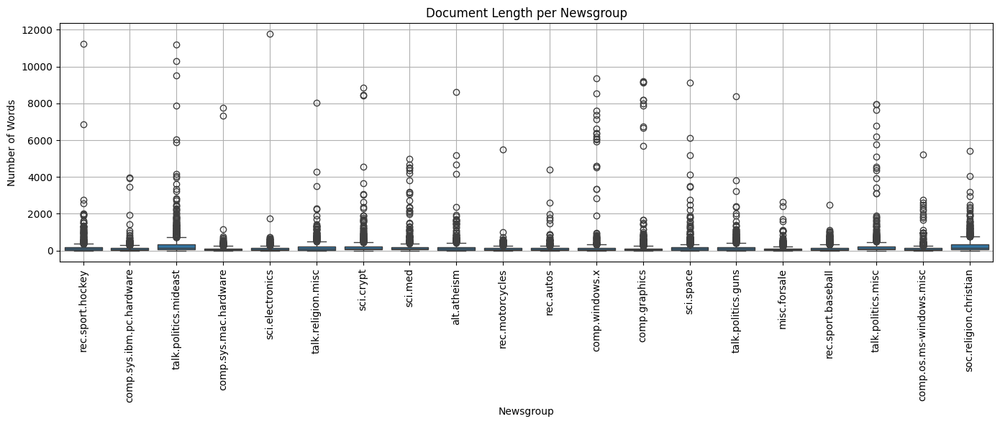

In [4]:
df['doc_length'] = df['text'].apply(lambda x: len(x.split()))

plt.figure(figsize=(14, 6))
sns.boxplot(x='target_name', y='doc_length', data=df)
plt.xticks(rotation=90)
plt.title("Document Length per Newsgroup")
plt.ylabel("Number of Words")
plt.xlabel("Newsgroup")
plt.grid(True)
plt.tight_layout()
plt.show()

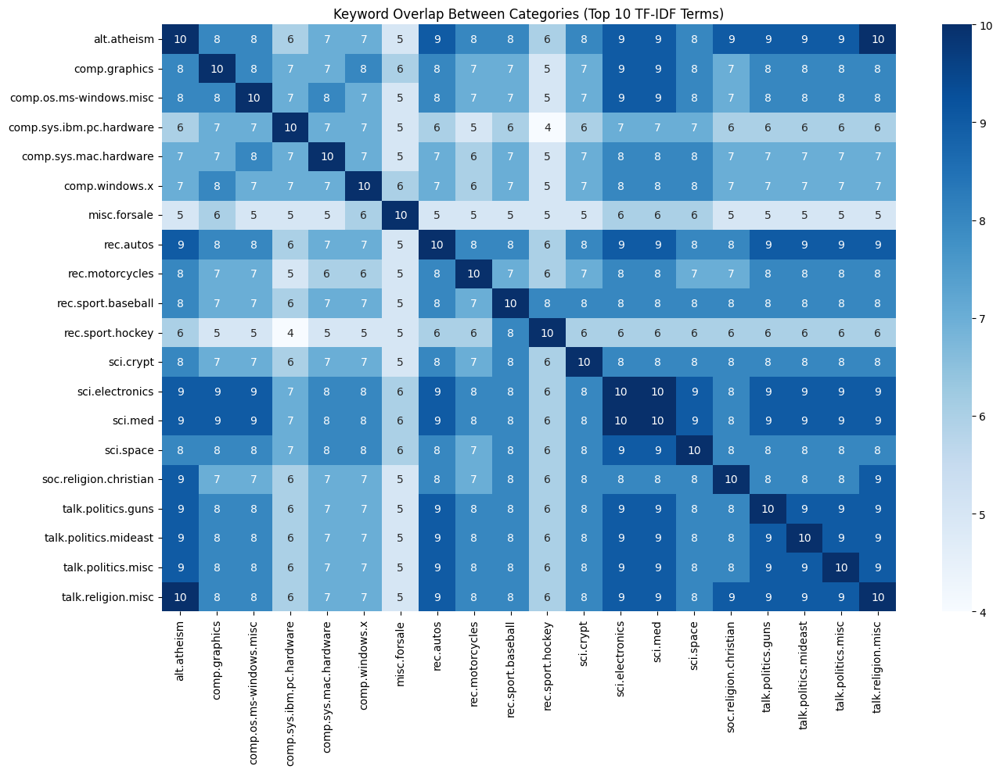

In [5]:
# Vectorize
tfidf = TfidfVectorizer(max_features=1000)
# Use 'text_lemmatized' if already preprocessed
X_tfidf = tfidf.fit_transform(df['text'])

# Build a category-level TF-IDF table
category_tfidf = pd.DataFrame(X_tfidf.toarray(), columns=tfidf.get_feature_names_out(), index=df['target_name'])
category_tfidf = category_tfidf.groupby(category_tfidf.index).mean()

# Extract top terms
top_terms_per_class = {}
for category in category_tfidf.index:
    top_terms = category_tfidf.loc[category].sort_values(ascending=False).head(10).index
    top_terms_per_class[category] = set(top_terms)

# Compute overlap
overlap_matrix = pd.DataFrame(index=top_terms_per_class.keys(), columns=top_terms_per_class.keys())
for cat1 in top_terms_per_class:
    for cat2 in top_terms_per_class:
        overlap = len(top_terms_per_class[cat1] & top_terms_per_class[cat2])
        overlap_matrix.loc[cat1, cat2] = overlap

# Plot


overlap_matrix = overlap_matrix.astype(int)
plt.figure(figsize=(14, 10))
sns.heatmap(overlap_matrix, cmap='Blues', annot=True, fmt='d')
plt.title("Keyword Overlap Between Categories (Top 10 TF-IDF Terms)")
plt.tight_layout()
plt.show()


/tmp/ipython-input-4212301668.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, y='target_name', order=df['target_name'].value_counts().index, palette='Spectral')


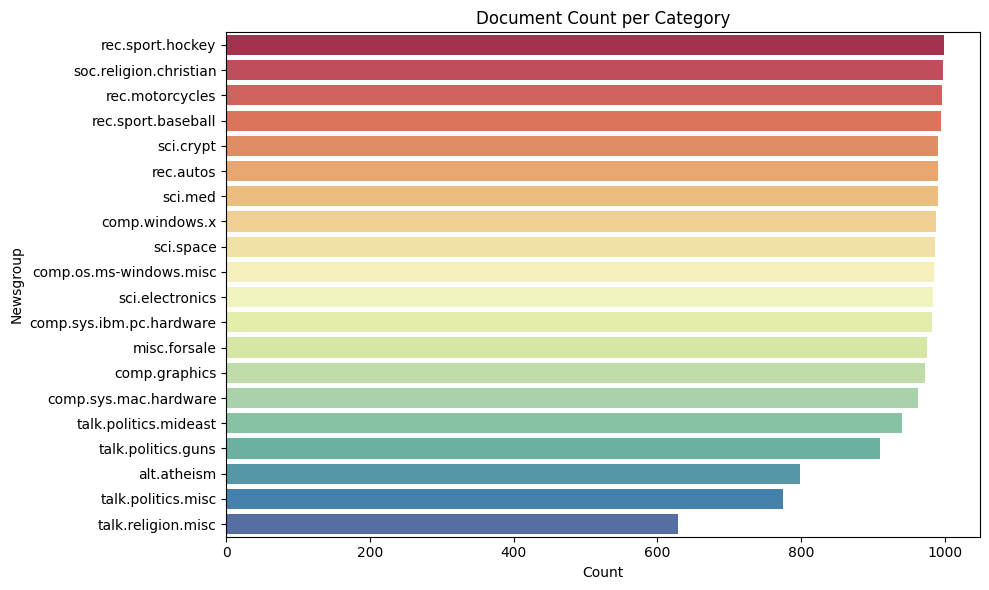

In [6]:
plt.figure(figsize=(10,6))
sns.countplot(data=df, y='target_name', order=df['target_name'].value_counts().index, palette='Spectral')
plt.title("Document Count per Category")
plt.xlabel("Count")
plt.ylabel("Newsgroup")
plt.tight_layout()
plt.show()


/tmp/ipython-input-7-1010210651.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(counts), y=list(words), palette='cubehelix')


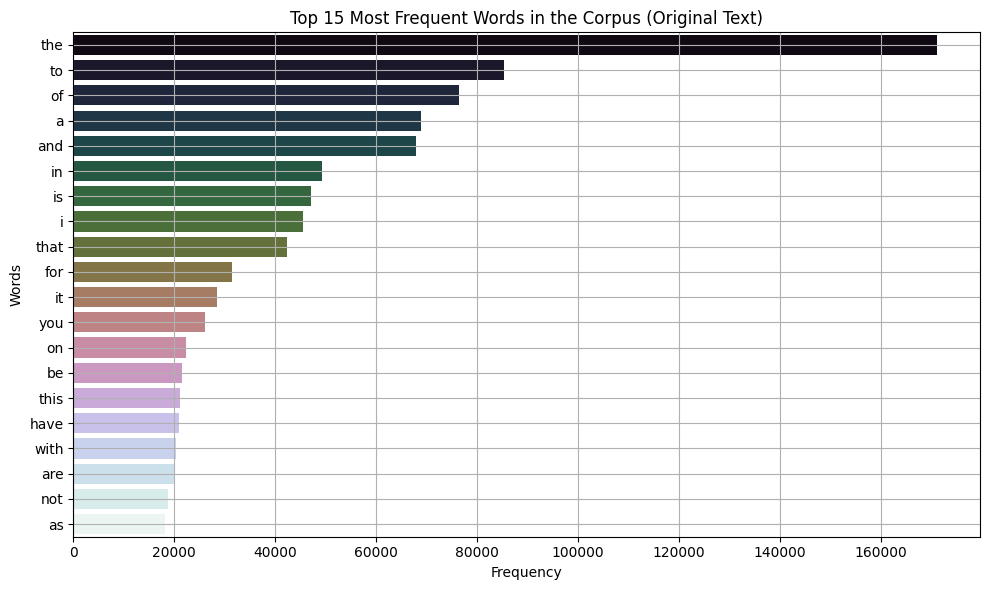

In [ ]:
# Use the original raw text column
all_words = ' '.join(df['text']).lower().split()
word_freq = Counter(all_words).most_common(20)
words, counts = zip(*word_freq)

plt.figure(figsize=(10, 6))
sns.barplot(x=list(counts), y=list(words), palette='cubehelix')
plt.title("Top 15 Most Frequent Words in the Corpus (Original Text)")
plt.xlabel("Frequency")
plt.ylabel("Words")
plt.grid(True)
plt.tight_layout()
plt.show()


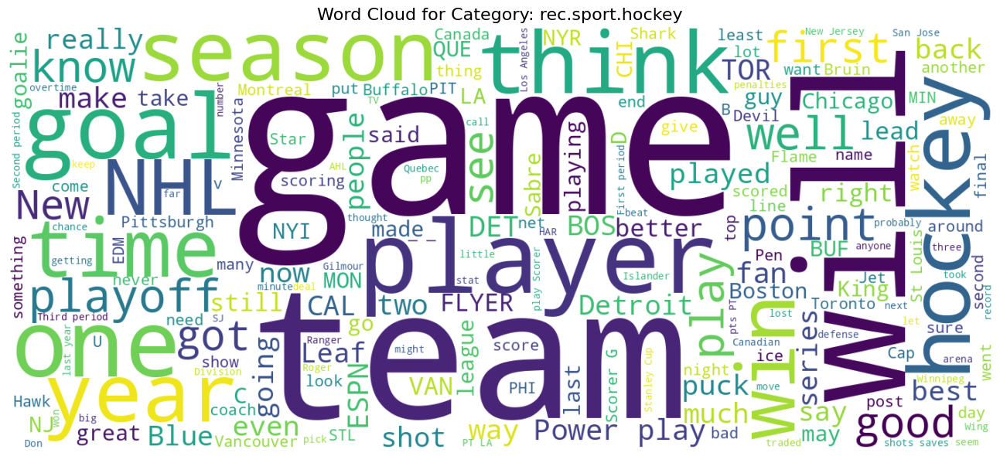

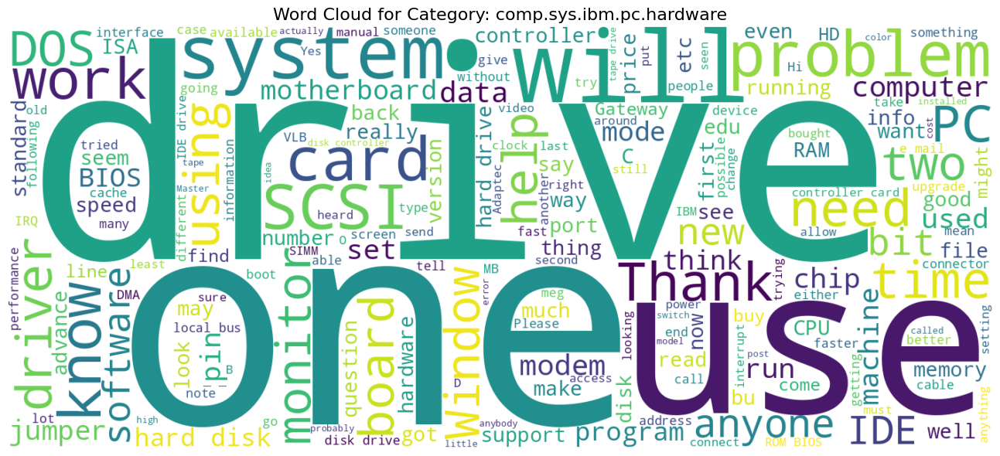

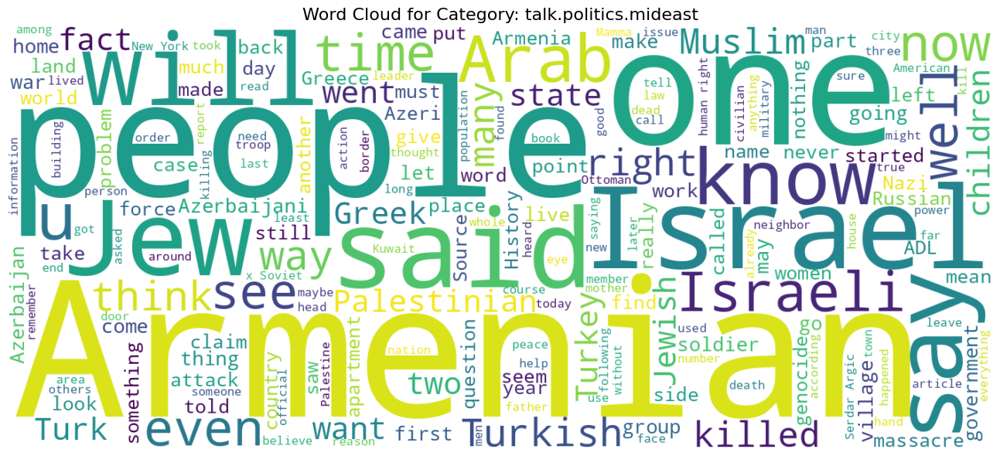

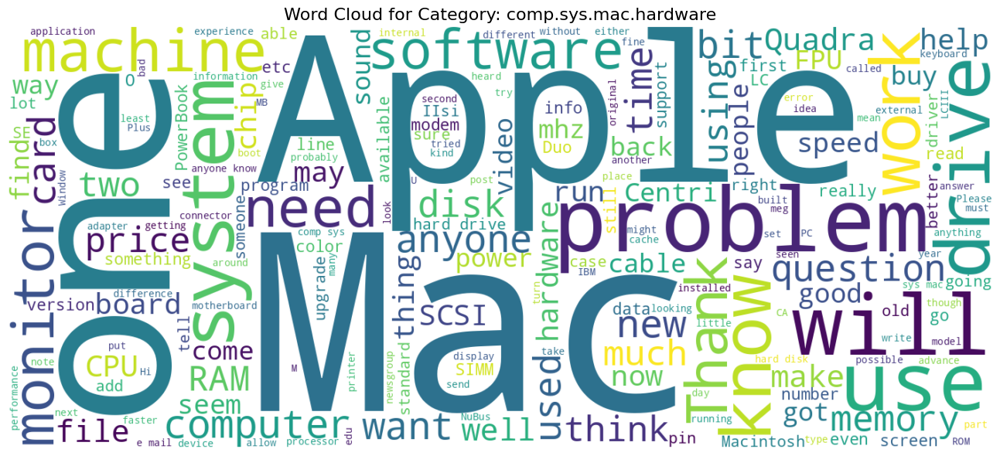

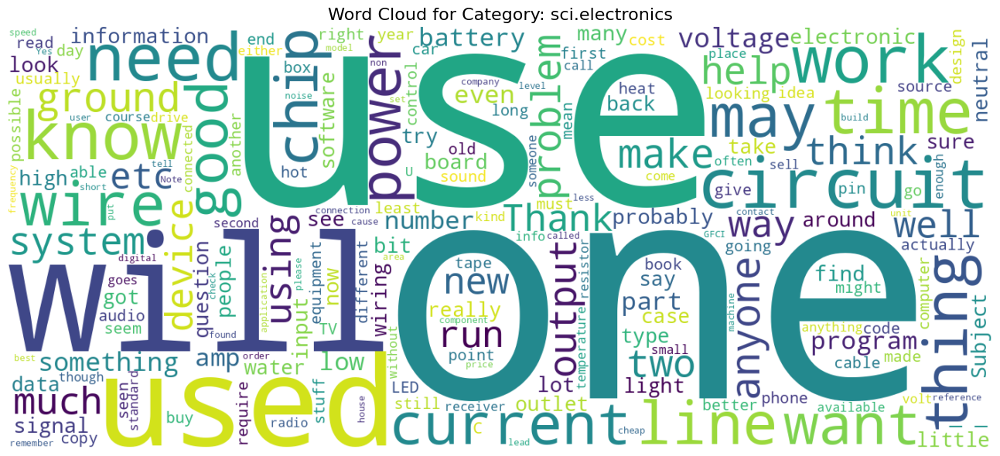

...

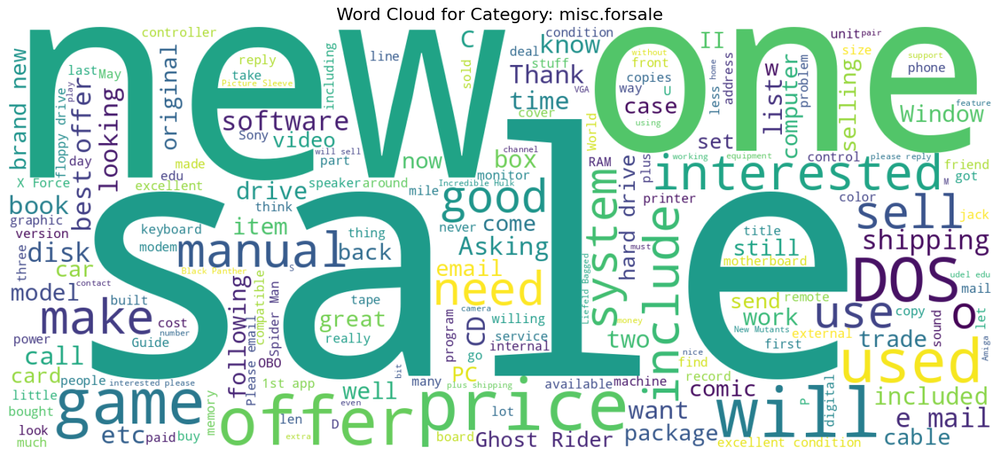

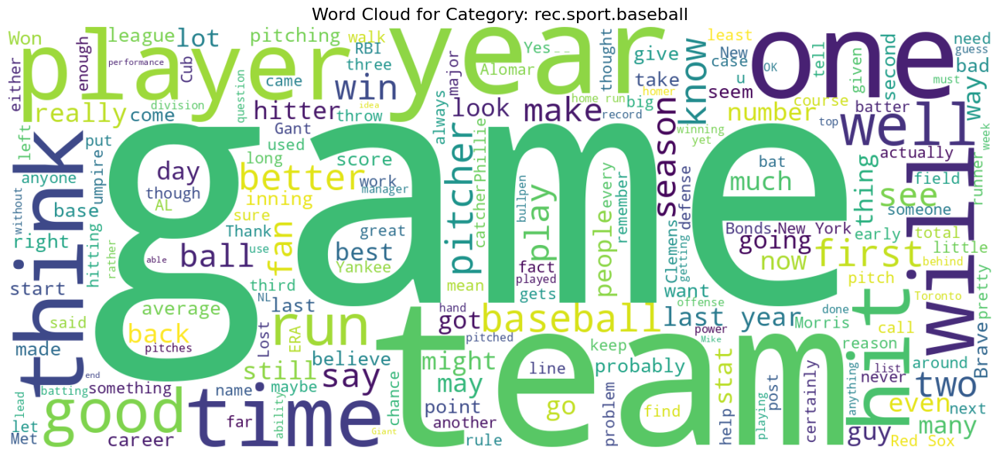

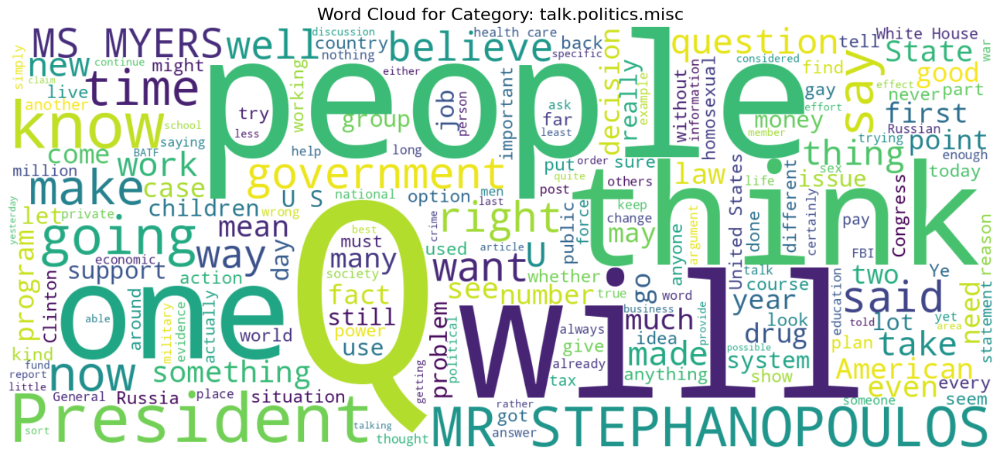

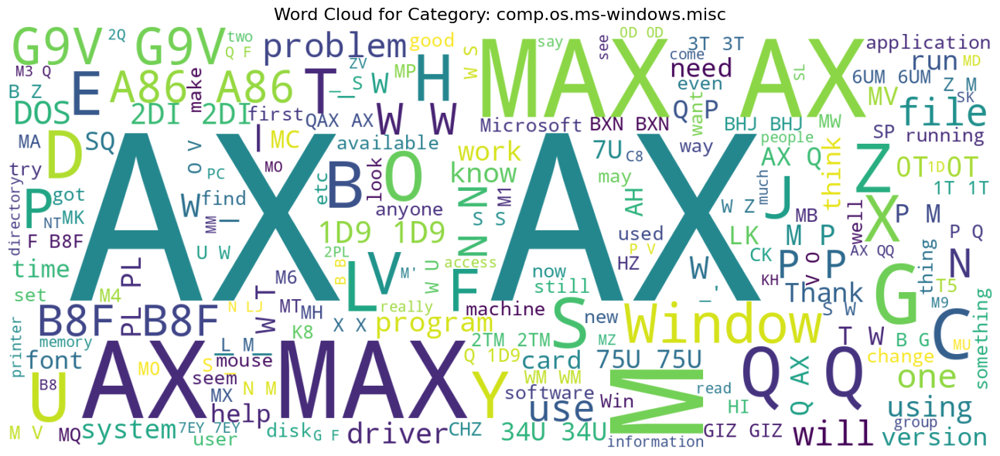

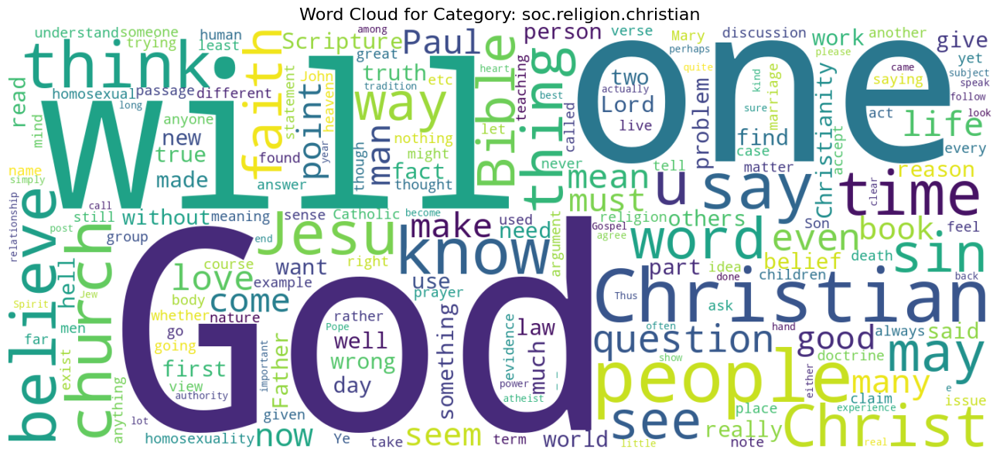

In [ ]:
# Loop through each category and generate word clouds
categories = df['target_name'].unique()

for category in categories:
    # Join all text for the current category
    category_text = ' '.join(df[df['target_name'] == category]['text'])

    # Generate word cloud (no stopword removal)
    wordcloud = WordCloud(width=1400, height=600, background_color='white').generate(category_text)

    # Plot
    plt.figure(figsize=(14, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for Category: {category}", fontsize=16)
    plt.tight_layout()
    plt.show()


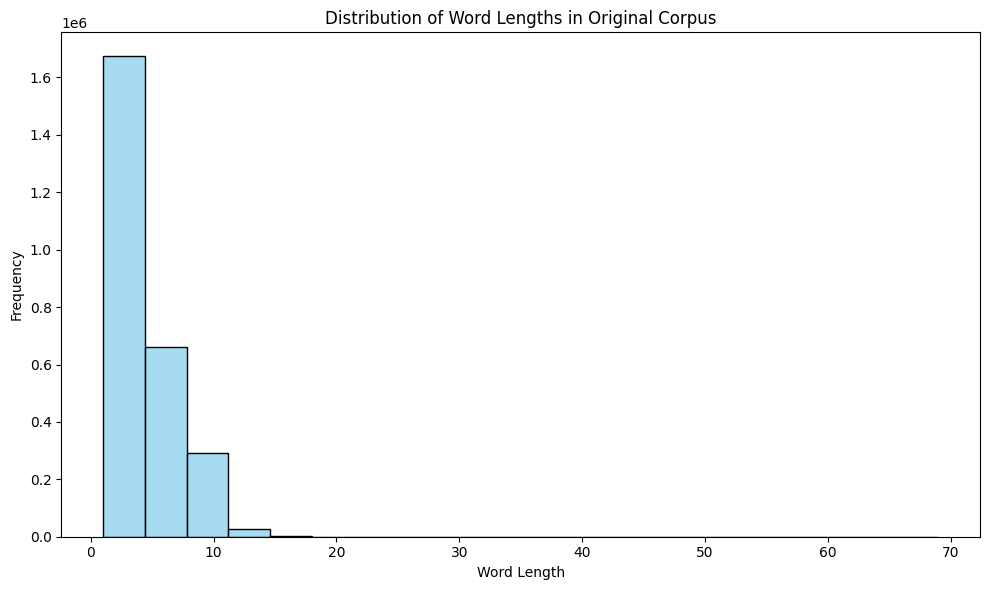

In [ ]:
# Flatten all words from the original text
all_words = ' '.join(df['text']).split()
word_lengths = [len(word) for word in all_words if word.isalpha()]

# Plot word length distribution
plt.figure(figsize=(10, 6))
sns.histplot(word_lengths, bins=20, color='skyblue')
plt.title("Distribution of Word Lengths in Original Corpus")
plt.xlabel("Word Length")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

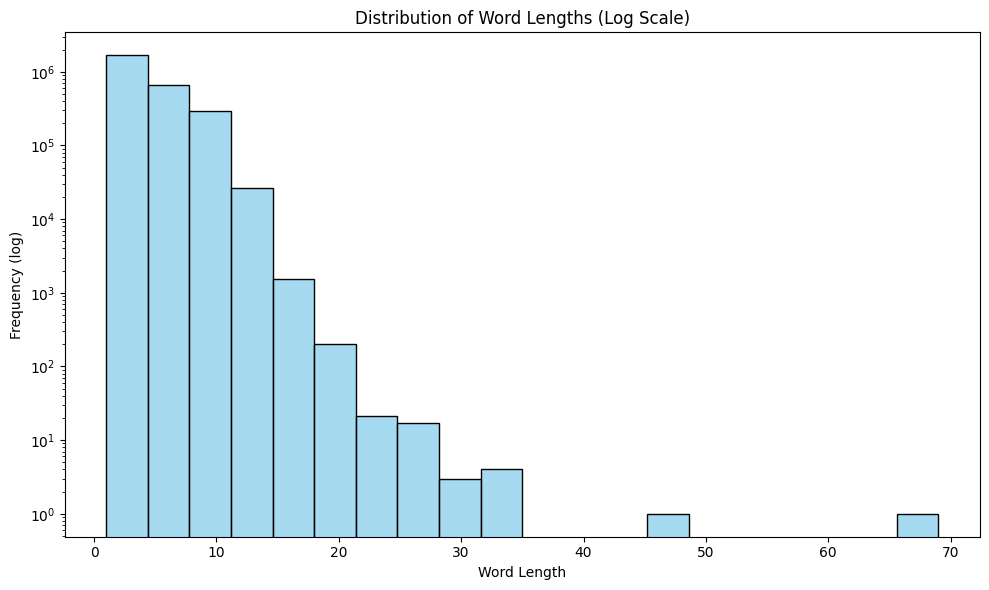

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(word_lengths, bins=20, color='skyblue')
plt.title("Distribution of Word Lengths (Log Scale)")
plt.xlabel("Word Length")
plt.ylabel("Frequency (log)")
plt.yscale('log')
plt.tight_layout()
plt.show()


In [7]:
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [8]:
df['text_clean'] = df['text'].str.lower()
df['text_clean'] = df['text_clean'].apply(lambda x: re.sub(f"[{string.punctuation}]", " ", x))
df['text_clean'] = df['text_clean'].apply(lambda x: re.sub(r"\d+", "", x))

In [9]:
stop_words = set(stopwords.words('english'))
df['text_no_stopwords'] = df['text_clean'].apply(lambda x: ' '.join([word for word in x.split() if word not in stop_words]))

In [10]:
lemmatizer = WordNetLemmatizer()
df['tokens'] = df['text_no_stopwords'].apply(lambda x: [lemmatizer.lemmatize(word) for word in x.split()])

In [11]:
df['tokens'] = df['tokens'].apply(lambda words: [word for word in words if word.isalpha() and 3 <= len(word) <= 20])

In [13]:
df['text_final'] = df['tokens'].apply(lambda x: ' '.join(x))

In [14]:
vectorizer = TfidfVectorizer(max_features=1000, ngram_range=(1, 2))
X_tfidf = vectorizer.fit_transform(df['text_final'])
print("TF-IDF shape:", X_tfidf.shape)

TF-IDF shape: (18846, 1000)


In [15]:
word_counts = Counter([word for tokens in df['tokens'] for word in tokens])
df['tokens'] = df['tokens'].apply(lambda tokens: [word for word in tokens if word_counts[word] > 2])

In [16]:
nltk.download('averaged_perceptron_tagger_eng')
df['tokens'] = df['tokens'].apply(
    lambda tokens: [word for (word, pos) in nltk.pos_tag(tokens) if pos.startswith('N') or pos.startswith('V')]
)

[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.


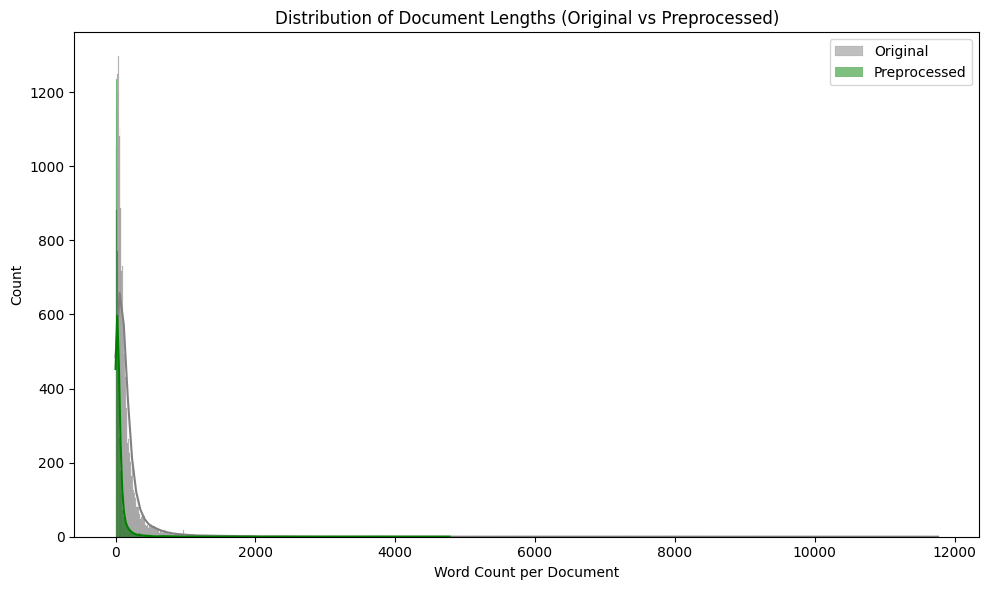

In [17]:
df['original_length'] = df['text'].apply(lambda x: len(x.split()))
df['cleaned_length'] = df['tokens'].apply(len)


plt.figure(figsize=(10,6))
sns.histplot(df['original_length'], color='gray', label='Original', kde=True)
sns.histplot(df['cleaned_length'], color='green', label='Preprocessed', kde=True)
plt.title("Distribution of Document Lengths (Original vs Preprocessed)")
plt.xlabel("Word Count per Document")
plt.legend()
plt.tight_layout()
plt.show()


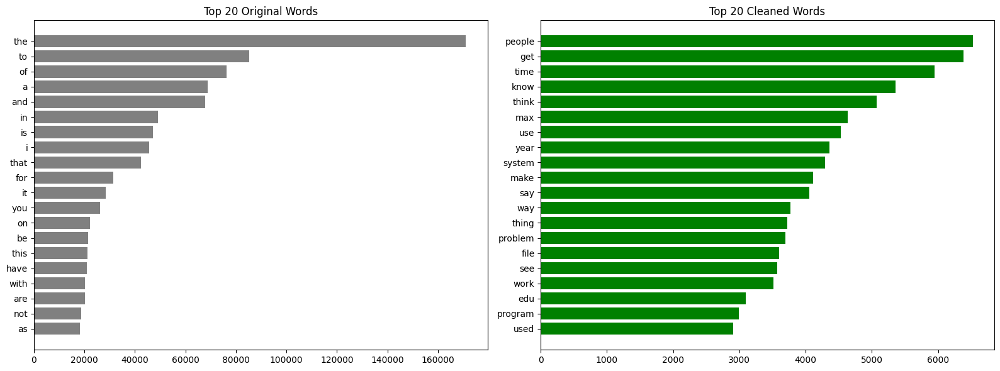

In [ ]:
# Flatten and count original
orig_words = [word for text in df['text'] for word in text.lower().split()]
orig_counts = Counter(orig_words).most_common(20)
orig_labels, orig_values = zip(*orig_counts)

# Flatten and count cleaned
clean_words = [word for tokens in df['tokens'] for word in tokens]
clean_counts = Counter(clean_words).most_common(20)
clean_labels, clean_values = zip(*clean_counts)

# Plot
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].barh(orig_labels[::-1], orig_values[::-1], color='gray')
axes[0].set_title("Top 20 Original Words")

axes[1].barh(clean_labels[::-1], clean_values[::-1], color='green')
axes[1].set_title("Top 20 Cleaned Words")

plt.tight_layout()
plt.show()


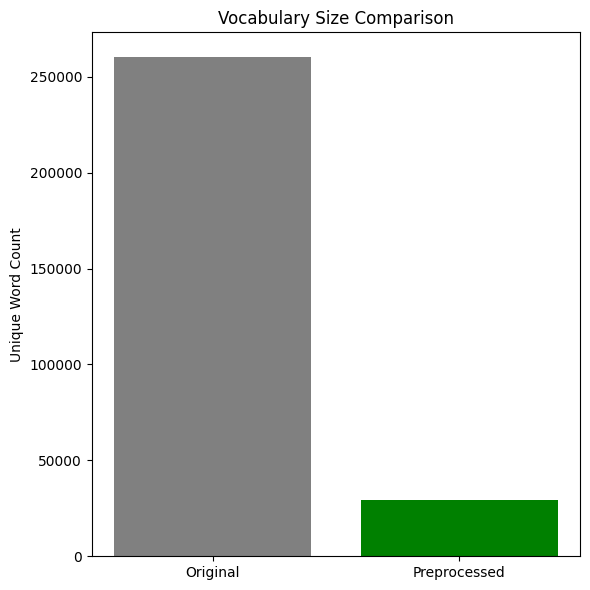

In [ ]:
original_vocab = set(orig_words)
cleaned_vocab = set(clean_words)

plt.figure(figsize=(6,6))
plt.bar(['Original', 'Preprocessed'], [len(original_vocab), len(cleaned_vocab)], color=['gray', 'green'])
plt.title("Vocabulary Size Comparison")
plt.ylabel("Unique Word Count")
plt.tight_layout()
plt.show()


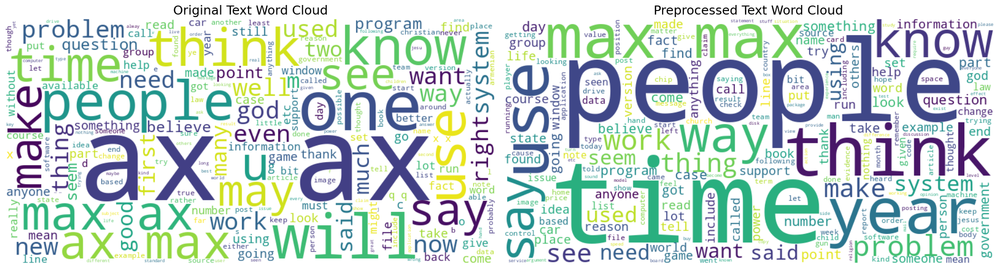

In [ ]:
orig_text = ' '.join(orig_words)
clean_text = ' '.join(clean_words)

fig, axs = plt.subplots(1, 2, figsize=(20, 8))

#Original
wordcloud_orig = WordCloud(width=800, height=400, background_color='white').generate(orig_text)
axs[0].imshow(wordcloud_orig, interpolation='bilinear')
axs[0].axis('off')
axs[0].set_title('Original Text Word Cloud', fontsize=18)

#Cleaned
wordcloud_clean = WordCloud(width=800, height=400, background_color='white').generate(clean_text)
axs[1].imshow(wordcloud_clean, interpolation='bilinear')
axs[1].axis('off')
axs[1].set_title('Preprocessed Text Word Cloud', fontsize=18)

plt.tight_layout()
plt.show()

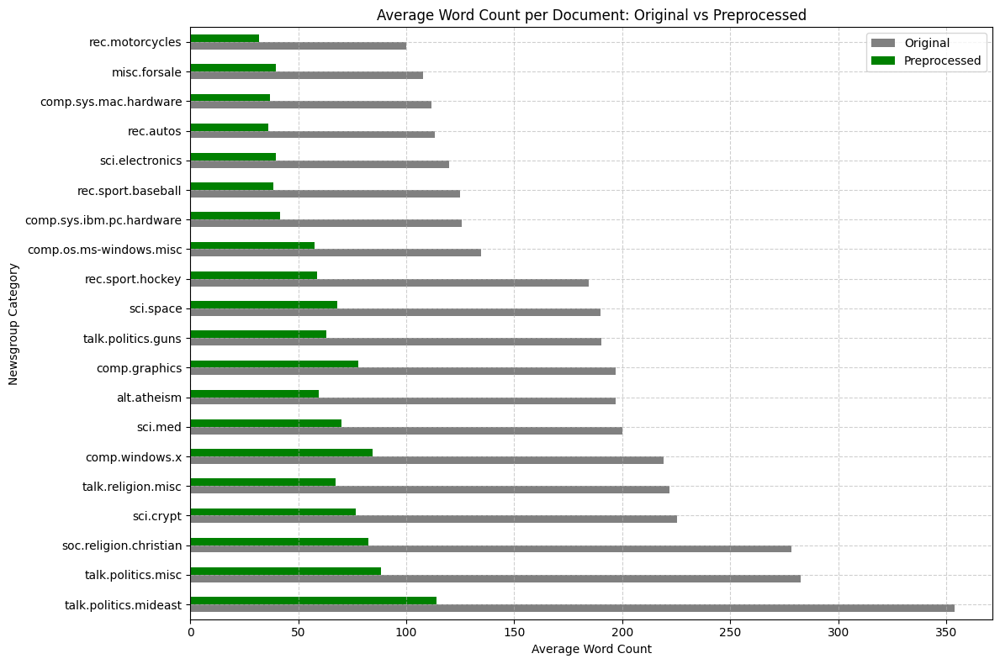

In [ ]:
#Original document length
df['original_length'] = df['text'].apply(lambda x: len(x.split()))

#Preprocessed document length (from token list)
df['cleaned_length'] = df['tokens'].apply(len)

#Group by category and compute mean lengths
length_comparison = df.groupby('target_name')[['original_length', 'cleaned_length']].mean().sort_values(by='original_length', ascending=False)

#Plot
length_comparison.plot(kind='barh', figsize=(12, 8), color=['gray', 'green'])
plt.title("Average Word Count per Document: Original vs Preprocessed")
plt.xlabel("Average Word Count")
plt.ylabel("Newsgroup Category")
plt.legend(["Original", "Preprocessed"])
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

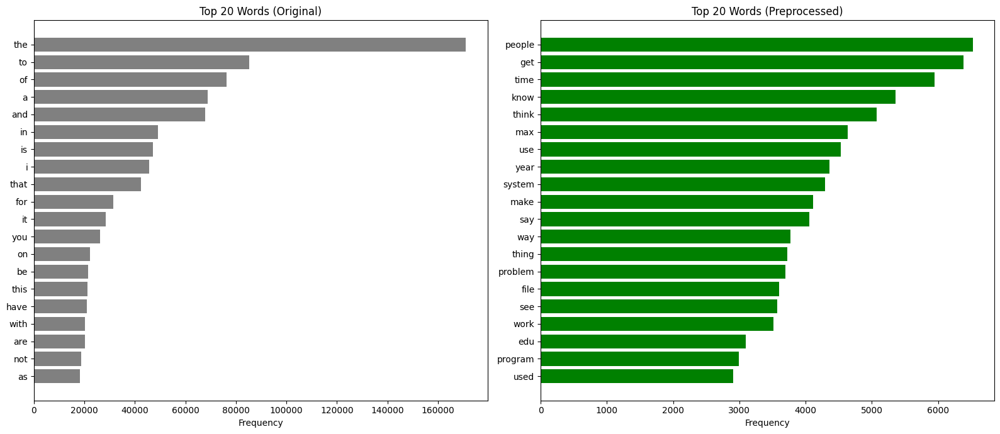

In [ ]:
# Original top words (no cleaning)
from collections import Counter
original_words = [word for text in df['text'] for word in text.lower().split()]
original_freq = Counter(original_words)
top_original = original_freq.most_common(20)
orig_words, orig_counts = zip(*top_original)

# Preprocessed top words (already done)
preproc_words = [word for tokens in df['tokens'] for word in tokens]
preproc_freq = Counter(preproc_words)
top_preproc = preproc_freq.most_common(20)
proc_words, proc_counts = zip(*top_preproc)

# Plot side-by-side
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# Original
axes[0].barh(orig_words[::-1], orig_counts[::-1], color='gray')
axes[0].set_title("Top 20 Words (Original)")
axes[0].set_xlabel("Frequency")

# Preprocessed
axes[1].barh(proc_words[::-1], proc_counts[::-1], color='green')
axes[1].set_title("Top 20 Words (Preprocessed)")
axes[1].set_xlabel("Frequency")

plt.tight_layout()
plt.show()

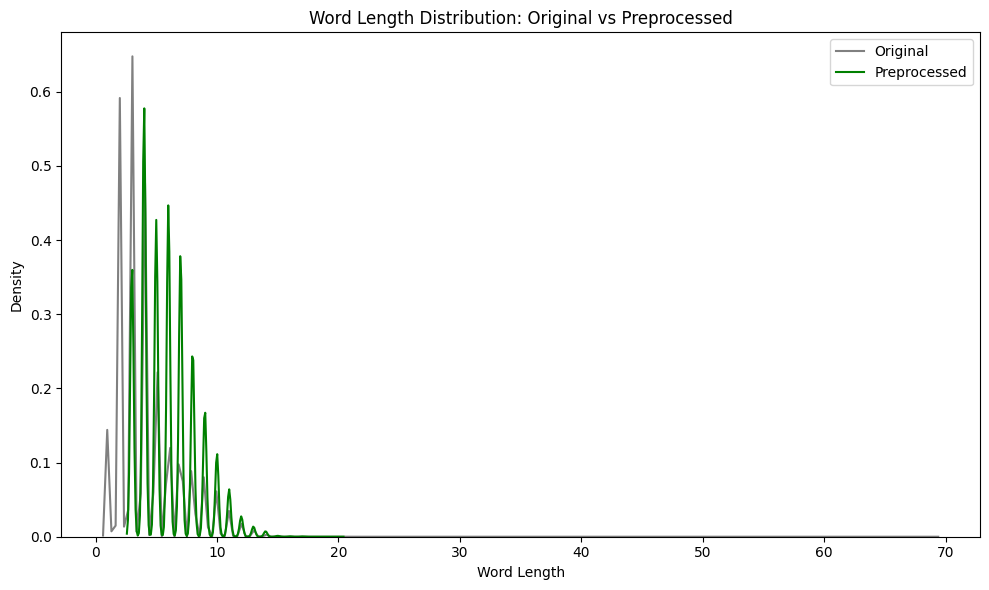

In [ ]:
original_lengths = [len(word) for word in original_words if word.isalpha()]
preproc_lengths = [len(word) for word in preproc_words if word.isalpha()]

plt.figure(figsize=(10,6))
sns.kdeplot(original_lengths, label='Original', color='gray')
sns.kdeplot(preproc_lengths, label='Preprocessed', color='green')
plt.title("Word Length Distribution: Original vs Preprocessed")
plt.xlabel("Word Length")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()

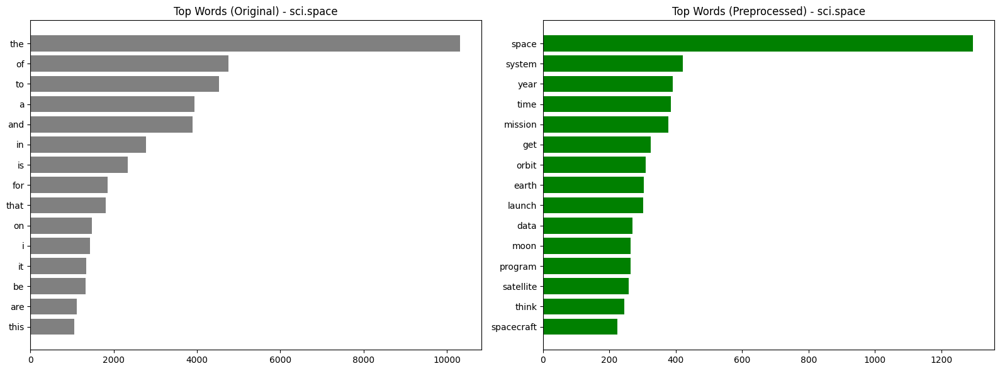

In [ ]:
# Choose sample category (sci.space)
category = 'sci.space'

# Original
cat_text = ' '.join(df[df['target_name'] == category]['text'].values).lower()
cat_tokens = [word for word in cat_text.split() if word.isalpha()]
top_cat_orig = Counter(cat_tokens).most_common(15)

# Preprocessed
cat_tokens_clean = [word for tokens in df[df['target_name'] == category]['tokens'] for word in tokens]
top_cat_clean = Counter(cat_tokens_clean).most_common(15)

# Plot
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Original
orig_words, orig_counts = zip(*top_cat_orig)
axes[0].barh(orig_words[::-1], orig_counts[::-1], color='gray')
axes[0].set_title(f"Top Words (Original) - {category}")

# Preprocessed
clean_words, clean_counts = zip(*top_cat_clean)
axes[1].barh(clean_words[::-1], clean_counts[::-1], color='green')
axes[1].set_title(f"Top Words (Preprocessed) - {category}")

plt.tight_layout()
plt.show()

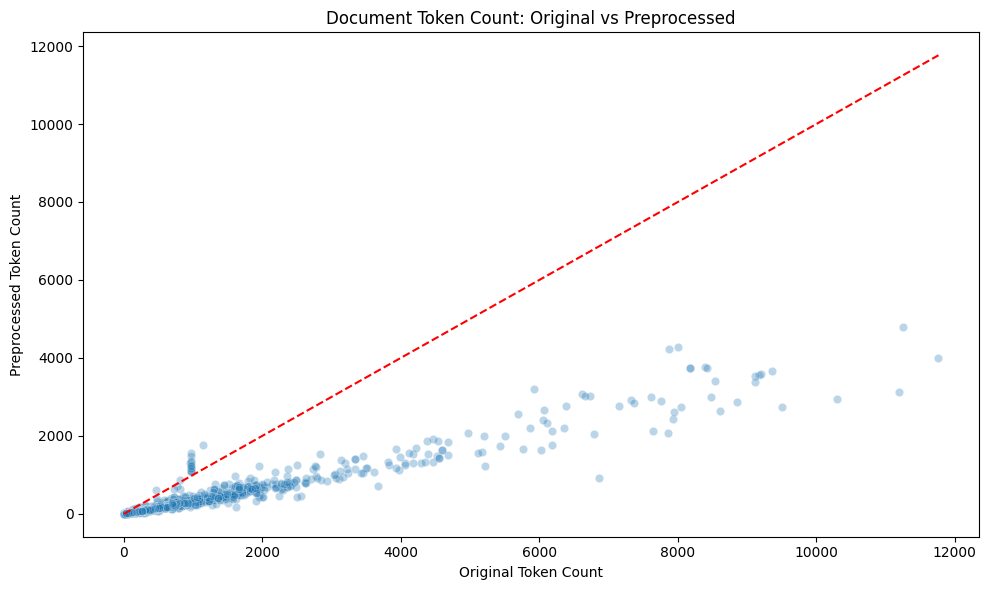

In [ ]:
# Create the columns needed for comparison
df['original_token_count'] = df['text'].apply(lambda x: len(x.split()))
df['cleaned_token_count'] = df['tokens'].apply(len)

plt.figure(figsize=(10,6))
sns.scatterplot(x=df['original_token_count'], y=df['cleaned_token_count'], alpha=0.3)
plt.plot([0, max(df['original_token_count'])], [0, max(df['original_token_count'])], '--', color='red')
plt.xlabel("Original Token Count")
plt.ylabel("Preprocessed Token Count")
plt.title("Document Token Count: Original vs Preprocessed")
plt.tight_layout()
plt.show()

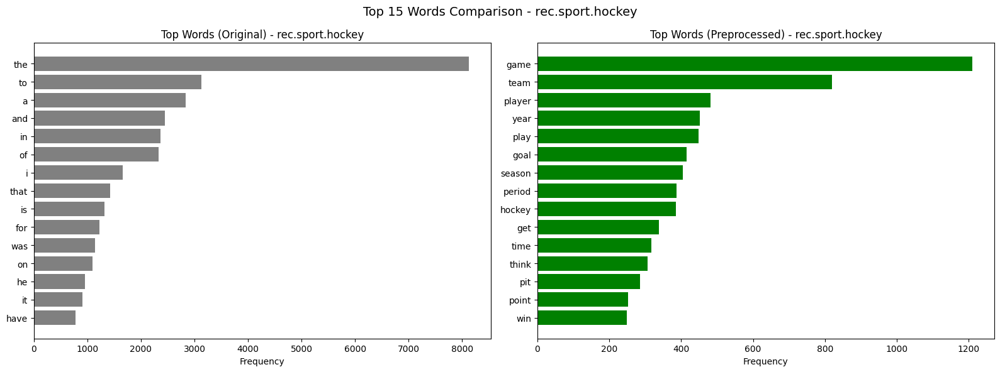

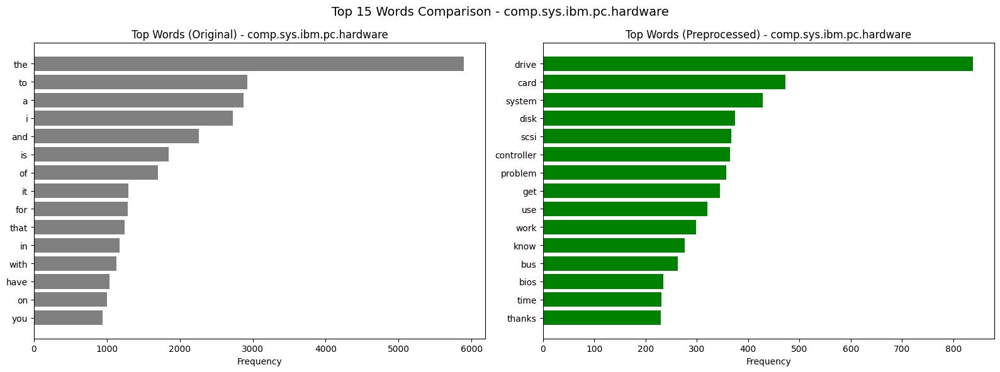

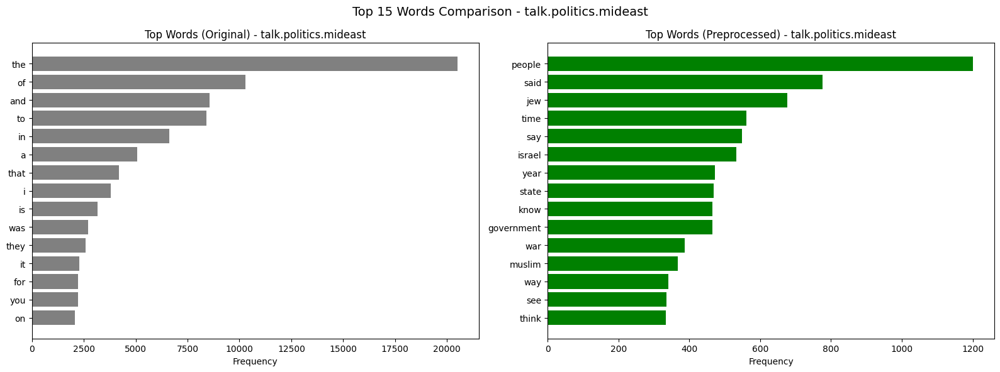

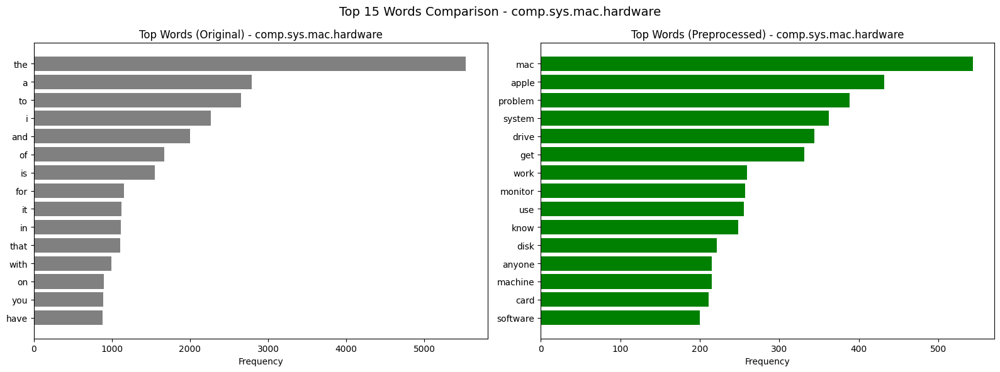

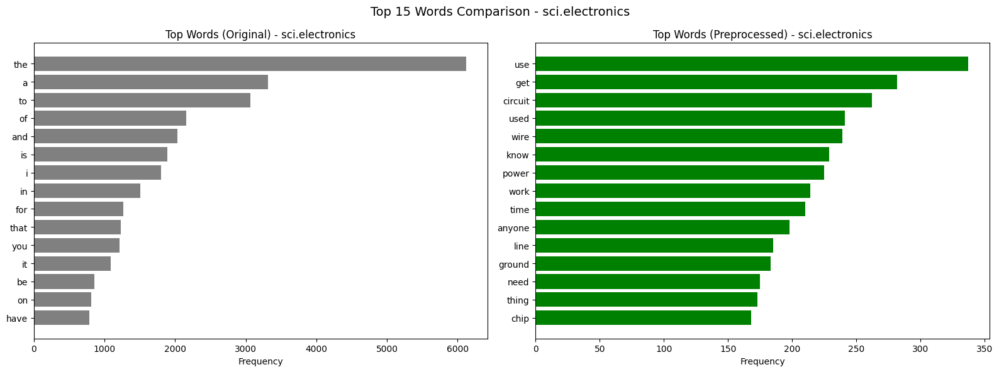

...

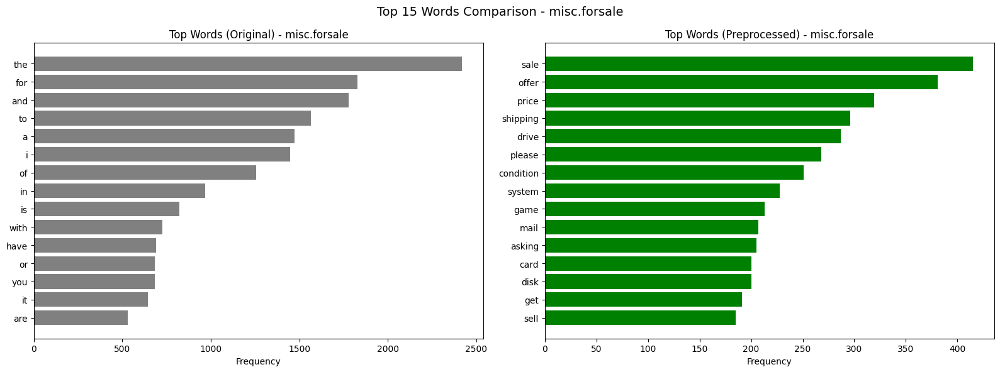

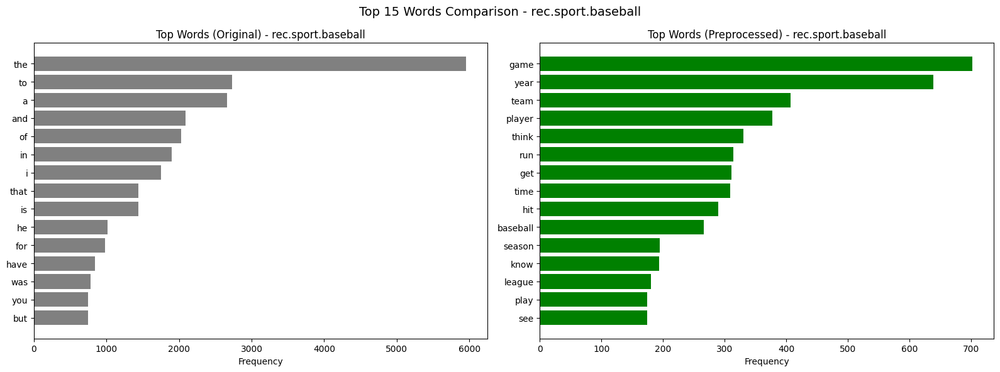

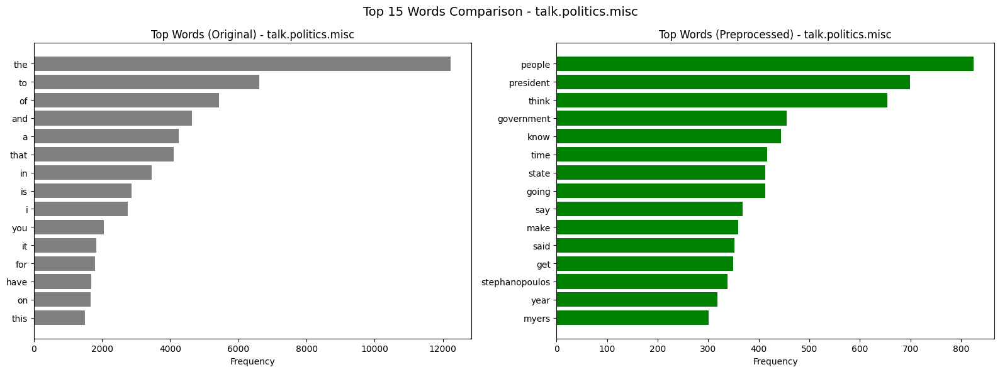

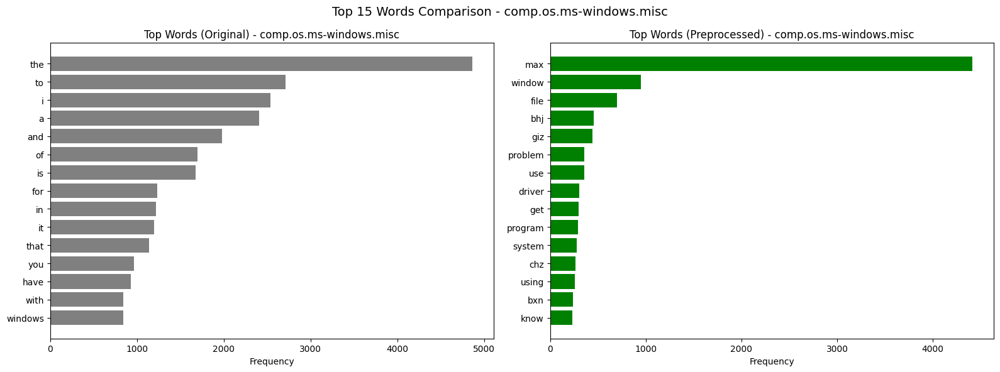

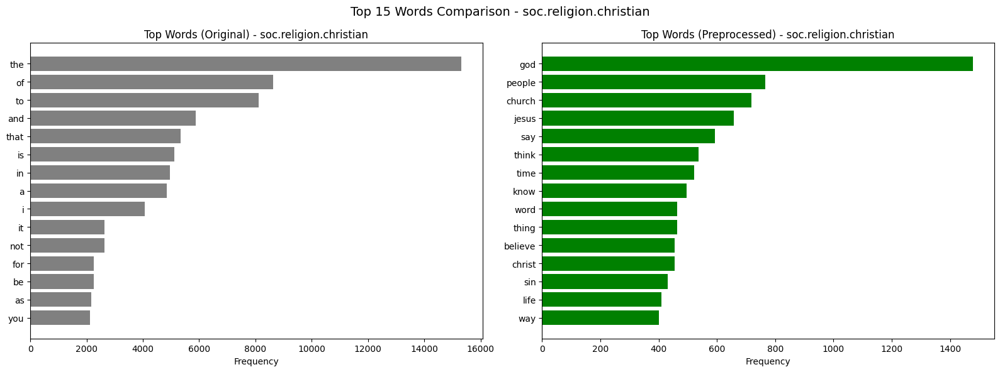

In [ ]:
# Loop through each category
categories = df['target_name'].unique()

for category in categories:
    # ORIGINAL: Flatten and filter words from raw text
    cat_text = ' '.join(df[df['target_name'] == category]['text'].values).lower()
    cat_tokens = [word for word in cat_text.split() if word.isalpha()]
    top_cat_orig = Counter(cat_tokens).most_common(15)

    # PREPROCESSED: From cleaned token list
    cat_tokens_clean = [word for tokens in df[df['target_name'] == category]['tokens'] for word in tokens]
    top_cat_clean = Counter(cat_tokens_clean).most_common(15)

    # Prepare the plots
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Original text plot
    if top_cat_orig:
        orig_words, orig_counts = zip(*top_cat_orig)
        axes[0].barh(orig_words[::-1], orig_counts[::-1], color='gray')
    axes[0].set_title(f"Top Words (Original) - {category}")
    axes[0].set_xlabel("Frequency")

    # Preprocessed text plot
    if top_cat_clean:
        clean_words, clean_counts = zip(*top_cat_clean)
        axes[1].barh(clean_words[::-1], clean_counts[::-1], color='green')
    axes[1].set_title(f"Top Words (Preprocessed) - {category}")
    axes[1].set_xlabel("Frequency")

    plt.suptitle(f"Top 15 Words Comparison - {category}", fontsize=14)
    plt.tight_layout()
    plt.show()

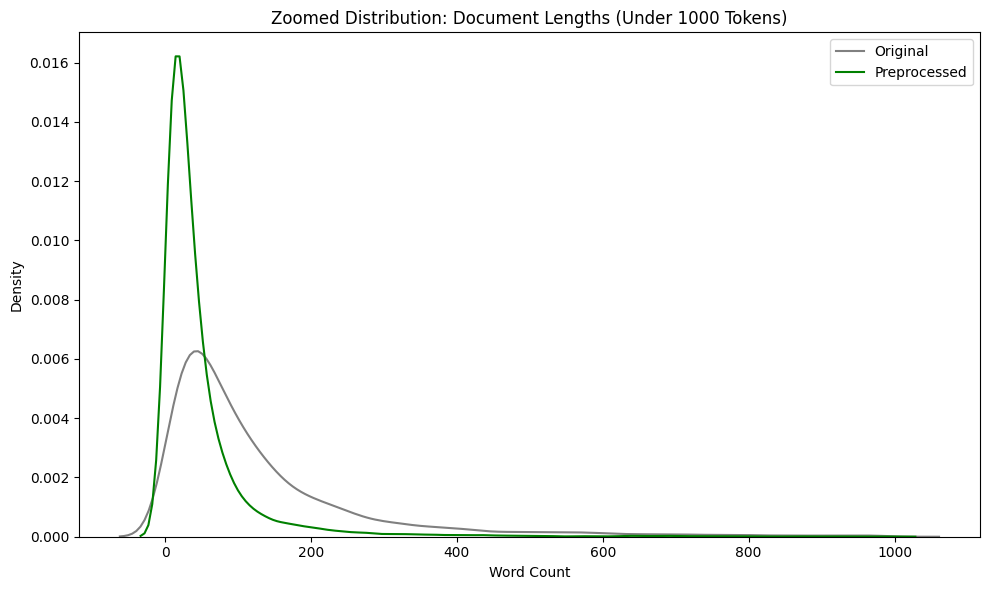

In [ ]:
plt.figure(figsize=(10,6))
sns.kdeplot(df[df['original_length'] < 1000]['original_length'], label='Original', color='gray')
sns.kdeplot(df[df['cleaned_length'] < 1000]['cleaned_length'], label='Preprocessed', color='green')
plt.title("Zoomed Distribution: Document Lengths (Under 1000 Tokens)")
plt.xlabel("Word Count")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1,2))
X_tfidf = vectorizer.fit_transform(df['text_final'])  # make sure df['text_final'] has cleaned text
y = df['target']  # class labels (ensure they're encoded numerically)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_tfidf, y, test_size=0.2, random_state=42)

In [ ]:
nb_model = MultinomialNB()
nb_model.fit(X_train, y_train)
nb_preds = nb_model.predict(X_test)

In [ ]:
print("Multinomial Naive Bayes Report:")
print(classification_report(y_test, nb_preds))
print("Accuracy:", accuracy_score(y_test, nb_preds))

Multinomial Naive Bayes Report:
              precision    recall  f1-score   support

           0       0.59      0.42      0.49       151
           1       0.59      0.66      0.62       202
           2       0.60      0.61      0.61       195
           3       0.51      0.66      0.57       183
           4       0.75      0.60      0.66       205
           5       0.75      0.76      0.76       215
           6       0.79      0.70      0.74       193
           7       0.70      0.66      0.68       196
           8       0.42      0.74      0.54       168
           9       0.86      0.81      0.83       211
          10       0.86      0.88      0.87       198
          11       0.77      0.74      0.75       201
          12       0.73      0.60      0.66       202
          13       0.83      0.78      0.80       194
          14       0.79      0.77      0.78       189
          15       0.52      0.88      0.65       202
          16       0.66      0.75      0.70      

In [ ]:
lr_model = LogisticRegression(max_iter=1000)
lr_model.fit(X_train, y_train)
lr_preds = lr_model.predict(X_test)

In [ ]:
print("Logistic Regression Report:")
print(classification_report(y_test, lr_preds))
print("Accuracy:", accuracy_score(y_test, lr_preds))

Logistic Regression Report:
              precision    recall  f1-score   support

           0       0.56      0.58      0.57       151
           1       0.61      0.64      0.62       202
           2       0.69      0.62      0.65       195
           3       0.54      0.57      0.56       183
           4       0.71      0.63      0.67       205
           5       0.75      0.74      0.75       215
           6       0.73      0.69      0.71       193
           7       0.70      0.66      0.68       196
           8       0.43      0.75      0.55       168
           9       0.84      0.80      0.82       211
          10       0.92      0.85      0.88       198
          11       0.85      0.69      0.76       201
          12       0.59      0.63      0.61       202
          13       0.76      0.84      0.79       194
          14       0.73      0.78      0.76       189
          15       0.69      0.75      0.72       202
          16       0.69      0.70      0.69       188

In [ ]:
svm_model = LinearSVC()
svm_model.fit(X_train, y_train)
svm_preds = svm_model.predict(X_test)

In [ ]:
print("Linear SVM Report:")
print(classification_report(y_test, svm_preds))
print("Accuracy:", accuracy_score(y_test, svm_preds))

Linear SVM Report:
              precision    recall  f1-score   support

           0       0.52      0.54      0.53       151
           1       0.66      0.67      0.67       202
           2       0.65      0.62      0.63       195
           3       0.53      0.58      0.56       183
           4       0.69      0.62      0.65       205
           5       0.75      0.74      0.75       215
           6       0.70      0.69      0.69       193
           7       0.44      0.70      0.54       196
           8       0.67      0.69      0.68       168
           9       0.83      0.81      0.82       211
          10       0.93      0.86      0.89       198
          11       0.84      0.73      0.78       201
          12       0.59      0.58      0.59       202
          13       0.81      0.79      0.80       194
          14       0.76      0.74      0.75       189
          15       0.70      0.74      0.72       202
          16       0.68      0.64      0.66       188
        

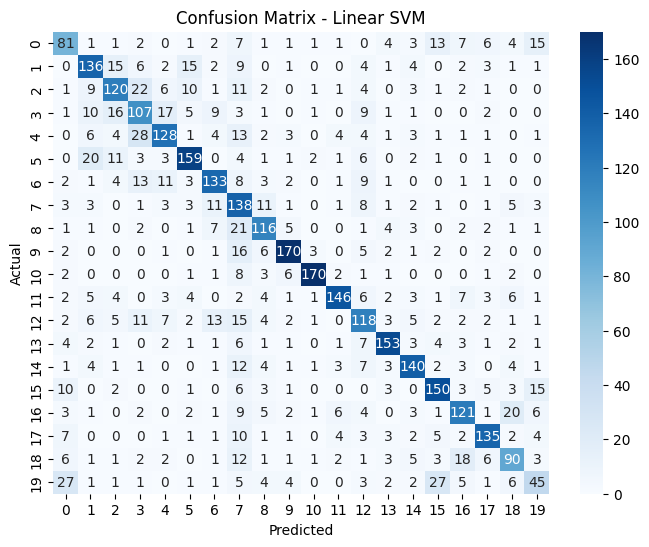

In [ ]:
conf_mat = confusion_matrix(y_test, svm_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Linear SVM")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
vectorizer = TfidfVectorizer(
    max_features=10000,    # More features
    ngram_range=(1, 2),    # Include bigrams
    min_df=3,              # Filter rare words
    max_df=0.85            # Filter overly common words
)

X_tfidf = vectorizer.fit_transform(df['text_final'])

In [ ]:
# Select top 3000 features
selector = SelectKBest(chi2, k=3000)
X_selected = selector.fit_transform(X_tfidf, df['target'])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_selected, df['target'], test_size=0.2, random_state=42)

In [ ]:
rf_model = RandomForestClassifier(n_estimators=200)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)

from sklearn.metrics import classification_report, accuracy_score
print("Random Forest Report:")
print(classification_report(y_test, rf_preds))
print("Accuracy:", accuracy_score(y_test, rf_preds))

Random Forest Report:
              precision    recall  f1-score   support

           0       0.56      0.43      0.49       151
           1       0.54      0.53      0.53       202
           2       0.60      0.63      0.61       195
           3       0.51      0.62      0.56       183
           4       0.64      0.60      0.62       205
           5       0.77      0.69      0.73       215
           6       0.75      0.62      0.68       193
           7       0.42      0.70      0.52       196
           8       0.56      0.65      0.61       168
           9       0.77      0.73      0.75       211
          10       0.79      0.79      0.79       198
          11       0.79      0.64      0.71       201
          12       0.57      0.50      0.54       202
          13       0.71      0.74      0.72       194
          14       0.68      0.75      0.71       189
          15       0.64      0.76      0.69       202
          16       0.61      0.67      0.64       188
     

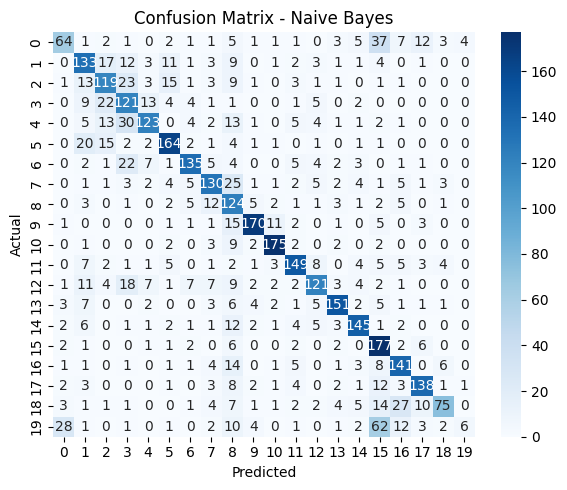

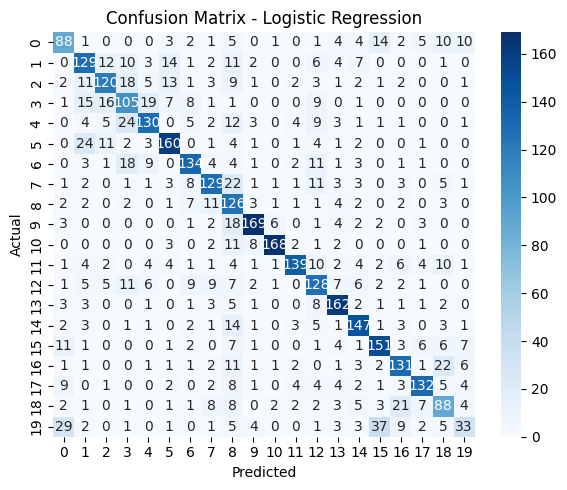

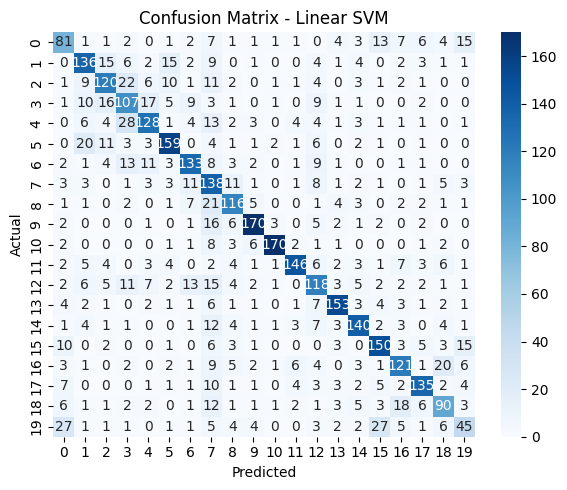

In [ ]:
model_preds = {
    "Naive Bayes": nb_preds,
    "Logistic Regression": lr_preds,
    "Linear SVM": svm_preds
}
y_test_true = y_test.values

# model_preds and y_test_true must be defined from your model code
for model_name, preds in model_preds.items():
    cm = confusion_matrix(y_test_true, preds)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

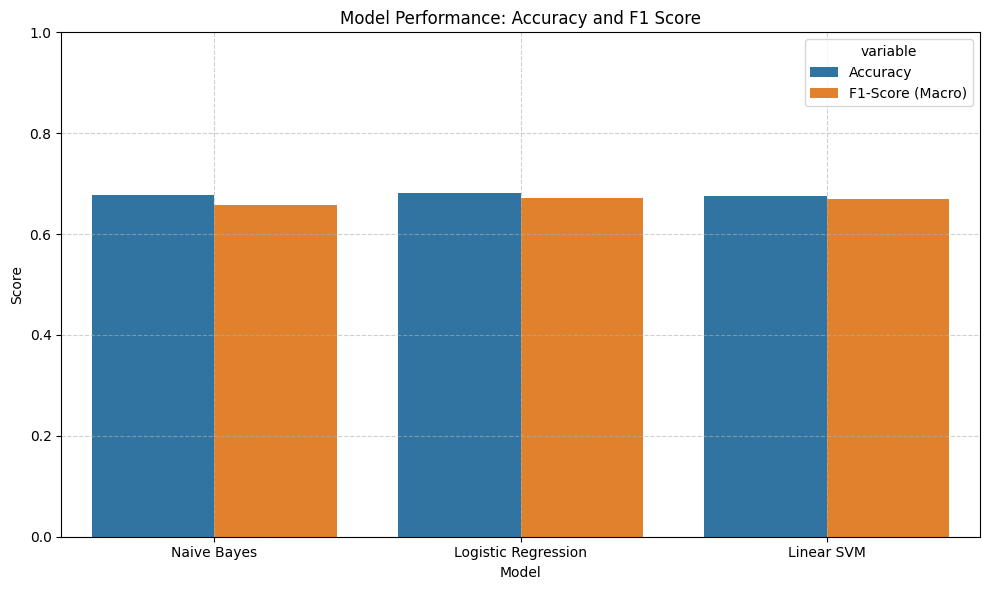

In [ ]:
# Now re-calculate metrics and plot again
metrics = {"Model": [], "Accuracy": [], "F1-Score (Macro)": []}

for name, preds in model_preds.items():
    metrics["Model"].append(name)
    metrics["Accuracy"].append(accuracy_score(y_test_true, preds))
    metrics["F1-Score (Macro)"].append(f1_score(y_test_true, preds, average='macro'))

metrics_df = pd.DataFrame(metrics)

plt.figure(figsize=(10, 6))
sns.barplot(data=metrics_df.melt(id_vars="Model"), x="Model", y="value", hue="variable")
plt.title("Model Performance: Accuracy and F1 Score")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
best_model = svm_model

newsgroups = fetch_20newsgroups(subset='train')
label_names = newsgroups.target_names

def predict_new_article_category(text):
    # cleaning
    cleaned = text.lower()
    cleaned = " ".join([word for word in cleaned.split() if word.isalpha()])

    # Vectorize input
    tfidf_input = vectorizer.transform([cleaned])

    # Ensure input shape matches model's expected shape
    if tfidf_input.shape[1] != best_model.n_features_in_:
        from scipy.sparse import hstack
        diff = best_model.n_features_in_ - tfidf_input.shape[1]
        if diff > 0:
            # Pad with zero columns
            from scipy.sparse import csr_matrix
            padding = csr_matrix((1, diff))
            tfidf_input = hstack([tfidf_input, padding])
        else:
            # Truncate to expected number of features
            tfidf_input = tfidf_input[:, :best_model.n_features_in_]

    # Predict
    prediction = best_model.predict(tfidf_input)[0]
    return label_names[prediction]

#sample Predict
article_text = """"The 36-year-old mum-of-three from Peterlee, County Durham, had paid Gemma Gray £75 for three "Botox" injections, half of what it had cost on a previous visit - the bargain turned out to be too good to be true.
Within days, Ms Bailey was struggling to see. Doctors at Sunderland Royal Hospital diagnosed her with ptosis, an eye condition characterised by the drooping of the upper eyelid, and told her to go home to rest.
The hospital trust said that when Ms Bailey was discharged she had been advised to visit her GP if her condition worsened, and it had been explained to her that her symptoms were probably related to the treatment she had had.
It added that botulinum toxicity was a very rare condition "not seen by the majority of doctors during their careers"."""
predicted_category = predict_new_article_category(article_text)
print("Predicted Category:", predicted_category)


Predicted Category: talk.politics.guns


In [18]:
texts = df['text_final'].values
labels = df['target'].values

max_words = 10000
max_len = 300

tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(texts)
sequences = tokenizer.texts_to_sequences(texts)

X_dl = pad_sequences(sequences, maxlen=max_len)

num_classes = np.max(labels) + 1
y_dl = to_categorical(labels, num_classes=num_classes)

X_train_dl, X_test_dl, y_train_dl, y_test_dl = train_test_split(
    X_dl, y_dl, test_size=0.2, random_state=42
)

In [19]:
model = Sequential()
model.add(Embedding(input_dim=max_words, output_dim=128, input_length=max_len))

# Bidirectional LSTM with dropout and recurrent dropout
model.add(Bidirectional(
    LSTM(64, return_sequences=False, dropout=0.3, recurrent_dropout=0.3)
))

model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

model.build(input_shape=(None, max_len))
model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/embedding.py:97: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ (None, 300, 128)       │     1,280,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 128)            │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 20)             │         2,580 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,381,396 (5.27 MB)

 Trainable params: 1,381,396 (5.27 MB)

 Non-trainable params: 0 (0.00 B)

In [20]:
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

In [21]:
history = model.fit(
    X_train_dl, y_train_dl,
    epochs=5,
    batch_size=64,
    validation_split=0.2,
    callbacks=[early_stop]
)

Epoch 1/5
189/189 ━━━━━━━━━━━━━━━━━━━━ 380s 2s/step - accuracy: 0.0757 - loss: 2.9534 - val_accuracy: 0.2331 - val_loss: 2.4672
Epoch 2/5
189/189 ━━━━━━━━━━━━━━━━━━━━ 354s 2s/step - accuracy: 0.2106 - loss: 2.4058 - val_accuracy: 0.3574 - val_loss: 2.0466
Epoch 3/5
189/189 ━━━━━━━━━━━━━━━━━━━━ 345s 2s/step - accuracy: 0.3443 - loss: 1.9575 - val_accuracy: 0.4410 - val_loss: 1.7237
Epoch 4/5
189/189 ━━━━━━━━━━━━━━━━━━━━ 348s 2s/step - accuracy: 0.4538 - loss: 1.6255 - val_accuracy: 0.4940 - val_loss: 1.5379
Epoch 5/5
189/189 ━━━━━━━━━━━━━━━━━━━━ 382s 2s/step - accuracy: 0.5535 - loss: 1.3446 - val_accuracy: 0.5461 - val_loss: 1.4105


In [22]:
loss, accuracy = model.evaluate(X_test_dl, y_test_dl)
print(f"Test Accuracy: {accuracy:.4f}")

118/118 ━━━━━━━━━━━━━━━━━━━━ 38s 321ms/step - accuracy: 0.5086 - loss: 1.4905
Test Accuracy: 0.5199


In [24]:
#Predict on the test set
y_prob = model.predict(X_test_dl, batch_size=256, verbose=0)
y_pred = np.argmax(y_prob, axis=1)

#Convert one-hot y_test back to label indices
y_true = np.argmax(y_test_dl, axis=1)

num_classes = y_prob.shape[1]
target_names = [f"Class {i}" for i in range(num_classes)]

#Print classification report & accuracy
print("LSTM Classification Report:")
print(classification_report(y_true, y_pred, target_names=target_names, digits=2))

acc = accuracy_score(y_true, y_pred)
print("LSTM Accuracy:", acc)

#Confusion matrix (both raw and normalized)
cm = confusion_matrix(y_true, y_pred, labels=range(num_classes))
cm_norm = confusion_matrix(y_true, y_pred, labels=range(num_classes), normalize='true')


#Save report as CSV
from sklearn.metrics import precision_recall_fscore_support
prec, rec, f1, support = precision_recall_fscore_support(y_true, y_pred, labels=range(num_classes), zero_division=0)

import pandas as pd
report_df = pd.DataFrame({
    "class": range(num_classes),
    "precision": prec,
    "recall": rec,
    "f1": f1,
    "support": support
})
report_df.loc["macro_avg"] = ["macro_avg", report_df["precision"].mean(), report_df["recall"].mean(), report_df["f1"].mean(), report_df["support"].sum()]
report_df.to_csv("lstm_classification_report.csv", index=False)
print("Saved per-class report to lstm_classification_report.csv")


LSTM Classification Report:
              precision    recall  f1-score   support

     Class 0       0.28      0.19      0.22       151
     Class 1       0.38      0.18      0.24       202
     Class 2       0.49      0.44      0.46       195
     Class 3       0.32      0.59      0.42       183
     Class 4       0.36      0.08      0.13       205
     Class 5       0.51      0.74      0.60       215
     Class 6       0.62      0.64      0.63       193
     Class 7       0.32      0.51      0.39       196
     Class 8       0.52      0.66      0.58       168
     Class 9       0.78      0.72      0.75       211
    Class 10       0.80      0.81      0.81       198
    Class 11       0.71      0.62      0.66       201
    Class 12       0.43      0.31      0.36       202
    Class 13       0.67      0.77      0.72       194
    Class 14       0.55      0.65      0.60       189
    Class 15       0.48      0.77      0.59       202
    Class 16       0.44      0.61      0.51       188

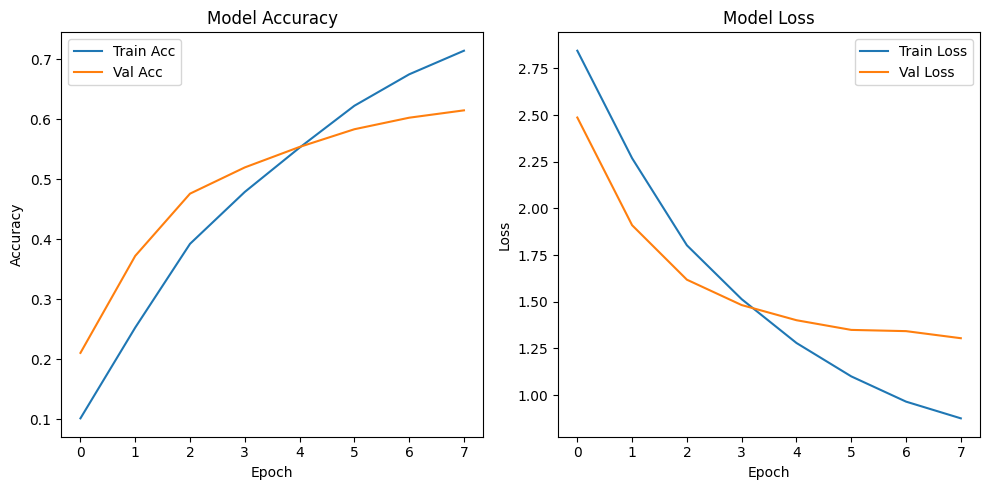

In [ ]:
plt.figure(figsize=(10, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title("Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title("Model Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
!pip install transformers
!pip install torch

In [ ]:
import transformers
import torch
print(transformers.__version__)
print(torch.__version__)

4.53.1
2.7.1+cu126


In [ ]:
!pip uninstall transformers -y

In [ ]:
import sys
"transformers" in sys.modules

True

In [ ]:
import os
os.kill(os.getpid(), 9)


In [ ]:
!pip install transformers --upgrade


In [ ]:
import transformers
print(transformers.__version__)


4.53.1


In [25]:
import torch
from torch.utils.data import Dataset, DataLoader
from torch.optim import AdamW
from transformers import DistilBertTokenizerFast, DistilBertForSequenceClassification, get_scheduler
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
import pandas as pd
import numpy as np

In [26]:
train_df, test_df = train_test_split(
    df,
    test_size=0.2,
    random_state=42,
    stratify=df['target']
)

print("Train size:", train_df.shape)
print("Test size:", test_df.shape)


Train size: (15076, 10)
Test size: (3770, 10)


In [27]:
tokenizer = DistilBertTokenizerFast.from_pretrained("distilbert-base-uncased")

train_encodings = tokenizer(
    train_df["text_final"].tolist(),
    truncation=True,
    padding="max_length",
    max_length=512,
    return_tensors="pt"
)

test_encodings = tokenizer(
    test_df["text_final"].tolist(),
    truncation=True,
    padding="max_length",
    max_length=512,
    return_tensors="pt"
)

train_labels = torch.tensor(train_df["target"].values)
test_labels = torch.tensor(test_df["target"].values)

print("Tokenization complete.")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

Tokenization complete.


In [28]:
class NewsDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
    def __getitem__(self, idx):
        item = {k: v[idx] for k, v in self.encodings.items()}
        item['labels'] = self.labels[idx]
        return item
    def __len__(self):
        return len(self.labels)

train_dataset = NewsDataset(train_encodings, train_labels)
test_dataset = NewsDataset(test_encodings, test_labels)

print("Datasets created.")


Datasets created.


In [29]:
batch_size = 16

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

print("DataLoaders ready.")


DataLoaders ready.


In [30]:
num_labels = df['target'].nunique()

model = DistilBertForSequenceClassification.from_pretrained(
    "distilbert-base-uncased",
    num_labels=num_labels
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

print("Model loaded on:", device)


model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Model loaded on: cuda


In [31]:
optimizer = AdamW(model.parameters(), lr=2e-5)

num_epochs = 2
total_steps = num_epochs * len(train_loader)

scheduler = get_scheduler(
    "linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=total_steps
)

print("Optimizer and scheduler ready.")


Optimizer and scheduler ready.


In [ ]:
for epoch in range(num_epochs):

    # Training step
    model.train()
    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}
        outputs = model(**batch)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        scheduler.step()
        optimizer.zero_grad()


    # Evaluate on training set
    model.eval()
    train_preds = []
    train_labels_all = []

    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}
        with torch.no_grad():
            outputs = model(**batch)
        logits = outputs.logits
        preds = torch.argmax(logits, dim=1)
        train_preds.extend(preds.cpu().numpy())
        train_labels_all.extend(batch["labels"].cpu().numpy())

    train_acc = accuracy_score(train_labels_all, train_preds)
    print(f"Epoch {epoch+1} — Training Accuracy: {train_acc:.4f}")


Epoch 1 — Training Accuracy: 0.7174
Epoch 2 — Training Accuracy: 0.7659


In [ ]:
model.eval()
all_preds = []
all_labels = []

for batch in test_loader:
    batch = {k: v.to(device) for k, v in batch.items()}
    with torch.no_grad():
        outputs = model(**batch)
    logits = outputs.logits
    preds = torch.argmax(logits, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(batch["labels"].cpu().numpy())

acc = accuracy_score(all_labels, all_preds)
print("Test Accuracy:", acc)

print("\n Classification Report:")
print(classification_report(all_labels, all_preds))


Test Accuracy: 0.7010610079575597

 Classification Report:
              precision    recall  f1-score   support

           0       0.43      0.47      0.45       160
           1       0.69      0.68      0.68       195
           2       0.62      0.54      0.58       197
           3       0.56      0.68      0.62       196
           4       0.71      0.62      0.66       193
           5       0.82      0.77      0.79       198
           6       0.78      0.77      0.77       195
           7       0.50      0.80      0.62       198
           8       0.72      0.71      0.72       199
           9       0.88      0.83      0.85       199
          10       0.91      0.89      0.90       200
          11       0.79      0.76      0.77       198
          12       0.69      0.69      0.69       197
          13       0.88      0.82      0.85       198
          14       0.84      0.78      0.81       197
          15       0.66      0.81      0.73       199
          16       0.6

In [ ]:
from transformers import BertTokenizerFast, BertForSequenceClassification, get_scheduler

tokenizer = BertTokenizerFast.from_pretrained("bert-base-uncased")

train_encodings = tokenizer(
    train_df["text_final"].tolist(),
    truncation=True,
    padding=True,
    max_length=512,
    return_tensors="pt"
)

test_encodings = tokenizer(
    test_df["text_final"].tolist(),
    truncation=True,
    padding=True,
    max_length=512,
    return_tensors="pt"
)

train_labels = torch.tensor(train_df["target"].values)
test_labels = torch.tensor(test_df["target"].values)


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

In [32]:
class NewsDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: val[idx] for key, val in self.encodings.items()}
        item["labels"] = self.labels[idx]
        return item

    def __len__(self):
        return len(self.labels)

train_dataset = NewsDataset(train_encodings, train_labels)
test_dataset = NewsDataset(test_encodings, test_labels)


In [ ]:
num_labels = df["target"].nunique()

model = BertForSequenceClassification.from_pretrained(
    "bert-base-uncased",
    num_labels=num_labels
)

In [34]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

optimizer = AdamW(model.parameters(), lr=2e-5)

num_epochs = 2
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
total_steps = num_epochs * len(train_loader)

scheduler = get_scheduler(
    "linear",
    optimizer=optimizer,
    num_warmup_steps=0,
    num_training_steps=total_steps
)


In [35]:
progress_bar = tqdm(range(total_steps))

model.train()
for epoch in range(num_epochs):
    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}
        outputs = model(**batch)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        scheduler.step()
        optimizer.zero_grad()
        progress_bar.update(1)
    print(f"Epoch {epoch+1} complete.")


  0%|          | 0/1886 [00:00<?, ?it/s]

Epoch 1 complete.
Epoch 2 complete.


In [36]:
model.eval()
all_preds = []
all_labels = []

test_loader = DataLoader(test_dataset, batch_size=16)

for batch in test_loader:
    batch = {k: v.to(device) for k, v in batch.items()}
    with torch.no_grad():
        outputs = model(**batch)
    logits = outputs.logits
    preds = torch.argmax(logits, dim=1)
    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(batch["labels"].cpu().numpy())

acc = accuracy_score(all_labels, all_preds)
print("Test Accuracy:", acc)
print(classification_report(all_labels, all_preds))


Test Accuracy: 0.7055702917771883
              precision    recall  f1-score   support

           0       0.47      0.47      0.47       160
           1       0.70      0.70      0.70       195
           2       0.64      0.50      0.56       197
           3       0.60      0.66      0.63       196
           4       0.71      0.64      0.67       193
           5       0.76      0.77      0.77       198
           6       0.79      0.79      0.79       195
           7       0.49      0.78      0.60       198
           8       0.74      0.70      0.72       199
           9       0.91      0.83      0.87       199
          10       0.91      0.89      0.90       200
          11       0.78      0.78      0.78       198
          12       0.69      0.68      0.69       197
          13       0.85      0.82      0.84       198
          14       0.83      0.82      0.82       197
          15       0.65      0.83      0.73       199
          16       0.61      0.71      0.65    

In [ ]:
all_preds = []
all_labels = []

In [ ]:
results = {
    "DistilBERT": {
        "accuracy": 0.69,
        "f1": 0.70
    },
    "BERT-base": {
        "accuracy": 0.76,
        "f1": 0.74
    }
}

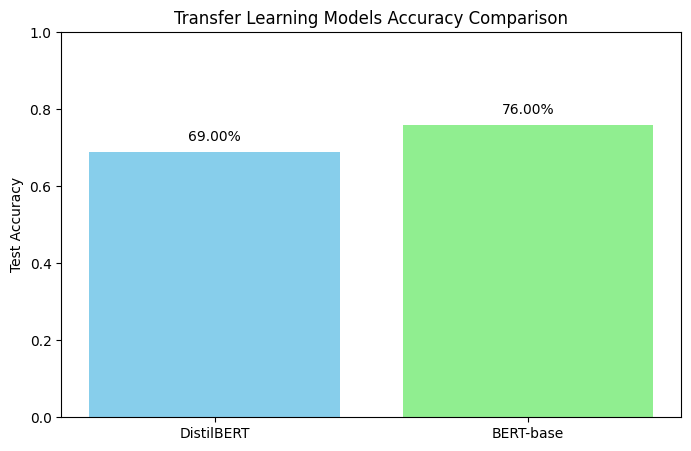

In [ ]:
import matplotlib.pyplot as plt

models = list(results.keys())
accuracies = [results[m]["accuracy"] for m in models]

plt.figure(figsize=(8,5))
bars = plt.bar(models, accuracies, color=['skyblue','lightgreen'])
plt.ylim(0,1)
plt.ylabel("Test Accuracy")
plt.title("Transfer Learning Models Accuracy Comparison")

# Add value labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2%}", ha='center', va='bottom')

plt.show()


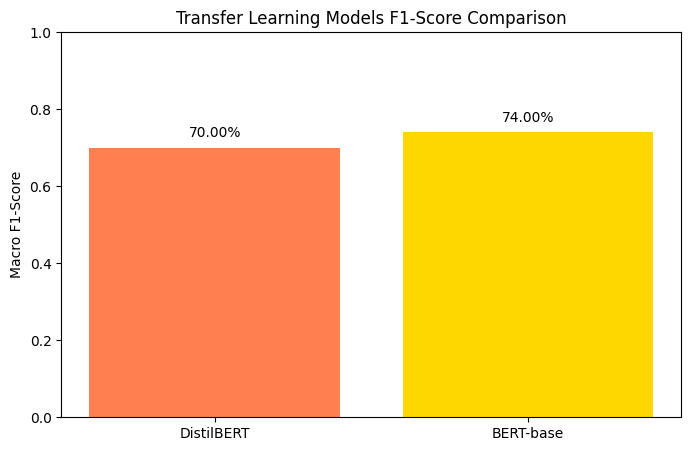

In [ ]:
f1s = [results[m]["f1"] for m in models]

plt.figure(figsize=(8,5))
bars = plt.bar(models, f1s, color=['coral','gold'])
plt.ylim(0,1)
plt.ylabel("Macro F1-Score")
plt.title("Transfer Learning Models F1-Score Comparison")

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2%}", ha='center', va='bottom')

plt.show()

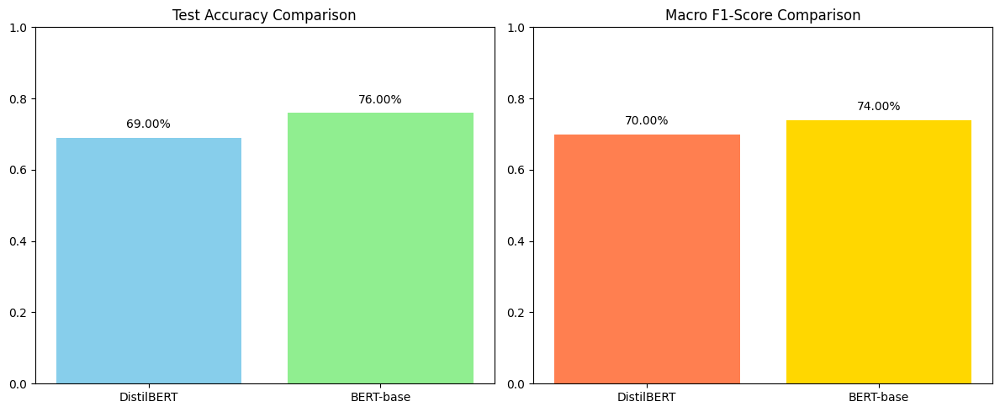

In [ ]:
models = list(results.keys())
accs = [results[m]["accuracy"] for m in models]
f1s = [results[m]["f1"] for m in models]

fig, axs = plt.subplots(1, 2, figsize=(12,5))

# Accuracy bar plot
bars1 = axs[0].bar(models, accs, color=['skyblue','lightgreen'])
axs[0].set_ylim(0,1)
axs[0].set_title("Test Accuracy Comparison")
for bar in bars1:
    yval = bar.get_height()
    axs[0].text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2%}", ha='center', va='bottom')

# F1-score bar plot
bars2 = axs[1].bar(models, f1s, color=['coral','gold'])
axs[1].set_ylim(0,1)
axs[1].set_title("Macro F1-Score Comparison")
for bar in bars2:
    yval = bar.get_height()
    axs[1].text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2%}", ha='center', va='bottom')

plt.tight_layout()
plt.show()


In [ ]:
data = [
    ["Traditional ML", "Logistic Regression", 0.68, 0.66],
    ["Traditional ML", "SVM", 0.69, 0.67],
    ["Deep Learning", "BiLSTM", 0.61, 0.58],
    ["Transfer Learning", "DistilBERT", 0.71, 0.70],
    ["Transfer Learning", "BERT-base", 0.76, 0.74]
]

df_results = pd.DataFrame(data, columns=["Type", "Model", "Accuracy", "F1"])
print(df_results)


                Type                Model  Accuracy    F1
0     Traditional ML  Logistic Regression      0.68  0.66
1     Traditional ML                  SVM      0.69  0.67
2      Deep Learning               BiLSTM      0.61  0.58
3  Transfer Learning           DistilBERT      0.71  0.70
4  Transfer Learning            BERT-base      0.76  0.74


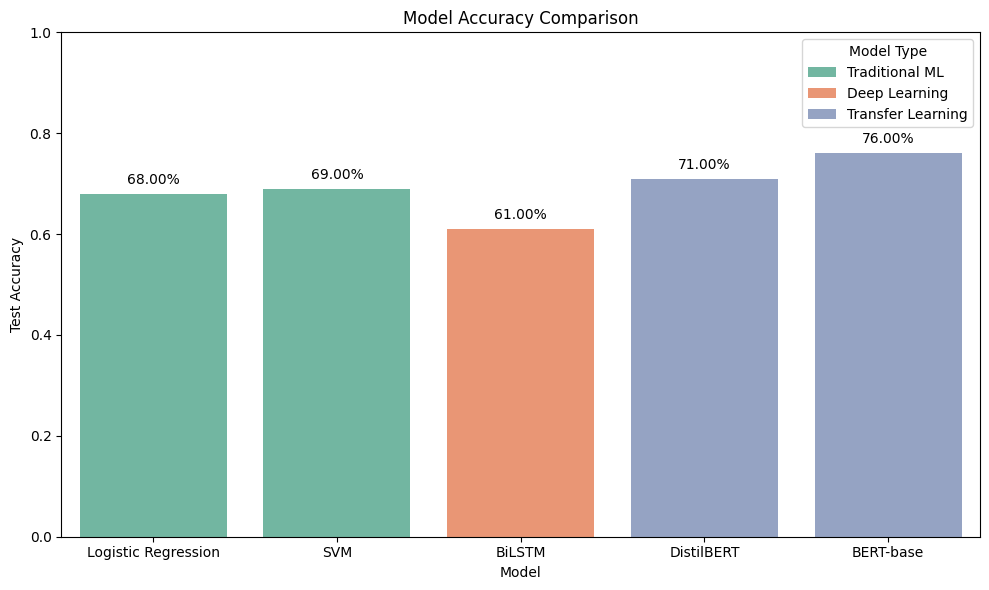

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(
    data=df_results,
    x="Model",
    y="Accuracy",
    hue="Type",
    palette="Set2"
)

plt.ylim(0,1)
plt.title("Model Accuracy Comparison")
plt.ylabel("Test Accuracy")
plt.xlabel("Model")
plt.legend(title="Model Type")

# Add text labels on bars
for i, row in df_results.iterrows():
    plt.text(i, row.Accuracy + 0.02, f"{row.Accuracy:.2%}", ha='center')

plt.tight_layout()
plt.show()

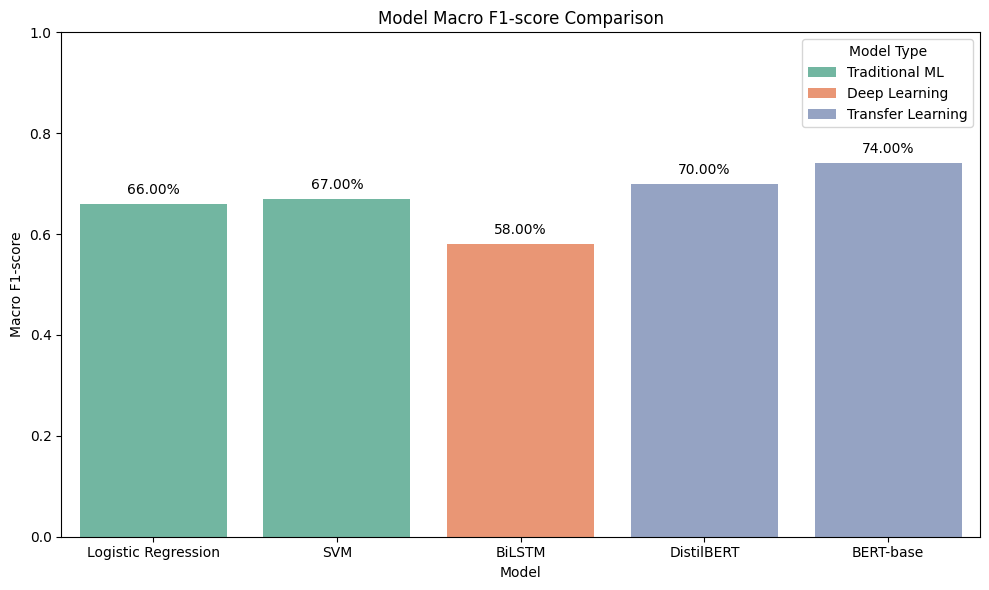

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(
    data=df_results,
    x="Model",
    y="F1",
    hue="Type",
    palette="Set2"
)

plt.ylim(0,1)
plt.title("Model Macro F1-score Comparison")
plt.ylabel("Macro F1-score")
plt.xlabel("Model")
plt.legend(title="Model Type")

for i, row in df_results.iterrows():
    plt.text(i, row.F1 + 0.02, f"{row.F1:.2%}", ha='center')

plt.tight_layout()
plt.show()

In [ ]:
data = [
    ["Traditional ML", "Logistic Regression", 0.68, 0.66, 15],
    ["Traditional ML", "SVM", 0.69, 0.67, 30],
    ["Deep Learning", "BiLSTM", 0.61, 0.58, 600],
    ["Transfer Learning", "DistilBERT", 0.71, 0.70, 800],
    ["Transfer Learning", "BERT-base", 0.76, 0.74, 1200]
]

df_results = pd.DataFrame(data, columns=["Type", "Model", "Accuracy", "F1", "TrainTime"])


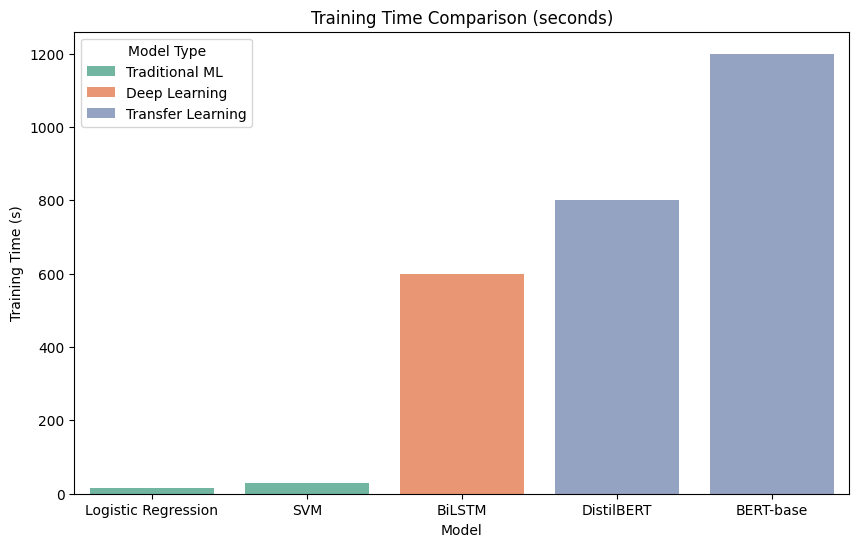

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(
    data=df_results,
    x="Model",
    y="TrainTime",
    hue="Type",
    palette="Set2"
)
plt.title("Training Time Comparison (seconds)")
plt.ylabel("Training Time (s)")
plt.xlabel("Model")
plt.legend(title="Model Type")
plt.show()